In [75]:
# interacting residues, only intenergysum columns as predictors

In [76]:
import pandas as pd
import numpy as np
import coclust

In [77]:
from sklearn.preprocessing import LabelEncoder

# CLUSTERING BY RESIDUE

## Data Transformation

In [78]:
df = pd.read_csv('data/364_interaction_energies_state_function_v4.txt', sep='\t')

# find residues where interactions are made

# get columns with 'sum' in their name
sum_cols = [col for col in df.columns if 'sum' in col]

# create empty lists for column counts and residue numbers
int_counts = []
resnums = []

# loop through sum columns and count interactions that don't have nonzero energies
for col in sum_cols:
    resnum = col[:4]
    resnums.append(resnum)
    count = len(df.loc[(df[col] != 0) & (df[col].notnull())])
    print(resnum, count)
    int_counts.append(count)

# find columns where no interactions are made
non_int_resnums = []

# get list of non-interacting resnums
for i in range(len(int_counts)):
    if int_counts[i] == 0:
        non_int_resnums.append(resnums[i])

# get list of interacting residues
# get columns with 'sum' in their name
sum_cols = [col for col in df.columns if 'sum' in col]

# create NEW empty lists for column counts and residue numbers
int_counts = []
int_resnums = []

for col in sum_cols:
    resnum = col[:4]
    if resnum not in non_int_resnums:
        int_resnums.append(resnum)
    
display(df)

1.21 0
1.22 0
1.23 0
1.24 0
1.25 0
1.26 0
1.27 1
1.28 0
1.29 0
1.30 2
1.31 5
1.32 0
1.33 0
1.34 2
1.35 10
1.36 1
1.37 0
1.38 2
1.39 15
1.40 0
1.41 0
1.42 8
1.43 2
1.44 0
1.45 0
1.46 0
1.47 0
1.48 0
1.49 0
1.50 0
1.51 0
1.52 0
1.53 0
1.54 0
1.55 0
1.56 0
1.57 0
1.58 0
1.59 0
1.60 0
2.34 0
2.35 0
2.36 0
2.37 0
2.38 0
2.39 1
2.40 0
2.41 2
2.42 0
2.43 0
2.44 0
2.45 2
2.46 0
2.47 0
2.48 2
2.49 0
2.50 3
2.51 0
2.52 0
2.53 7
2.54 4
2.55 0
2.56 5
2.57 20
2.58 5
2.59 1
2.60 49
2.61 41
2.62 1
2.63 14
2.64 43
2.65 19
2.66 1
2.67 3
2.68 1
2.69 0
2.70 0
3.19 0
3.20 0
3.21 2
3.22 0
3.23 1
3.24 1
3.25 6
3.26 1
3.27 0
3.28 48
3.29 71
3.30 4
3.31 0
3.32 210
3.33 181
3.34 2
3.35 6
3.36 114
3.37 37
3.38 0
3.39 2
3.40 3
3.41 1
3.42 0
3.43 0
3.44 1
3.45 1
3.46 0
3.47 0
3.48 0
3.49 0
3.50 0
3.51 0
3.52 0
3.53 0
3.54 0
3.55 0
3.56 0
3.57 0
3.58 0
3.59 0
3.60 0
3.61 0
3.62 0
3.63 0
3.64 0
3.65 0
3.66 0
3.67 0
3.68 0
3.69 0
3.70 0
3.71 0
4.29 0
4.30 0
4.31 0
4.32 0
4.33 0
4.34 0
4.35 0
4.36 0
4.37 0
4.38 0
4.3

,index,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,...,7.67_intenergysum,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2
0,1,7EW2,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,7EW3,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,7EW4,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,7EW1,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,7LD4,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359,387,5C1M,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
360,388,4EJ4,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
361,389,4DKL,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
362,390,6Z10,Intermediate,Antagonist,0.0,None,0.0,None,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [80]:
# get residue numbers to serve as rows for new dataframe
resnums = []
cols = [col for col in df.columns if 'sum' in col]

for col in cols:
    resnum = col[:4]
    resnums.append(resnum)
    
#print(resnums)

In [81]:
# get list of PDBID values, states, functions
PDBIDs = list(df['PDBID'])
states = list(df['State'])
functions = list(df['Function'])
#PDBIDs

In [82]:
# generate column names for new dataframe
colnames = []

for PDBID in PDBIDs:
    colnames.append(PDBID + '_state') # new 5/17
    colnames.append(PDBID + '_function') # new 5/17
    colnames.append(PDBID + '_intenergysum')
    colnames.append(PDBID + '_inttype1')
    colnames.append(PDBID + '_intenergy1')
    colnames.append(PDBID + '_inttype2')
    colnames.append(PDBID + '_intenergy2')

In [83]:
colnames

['7EW2_state',
 '7EW2_function',
 '7EW2_intenergysum',
 '7EW2_inttype1',
 '7EW2_intenergy1',
 '7EW2_inttype2',
 '7EW2_intenergy2',
 '7EW3_state',
 '7EW3_function',
 '7EW3_intenergysum',
 '7EW3_inttype1',
 '7EW3_intenergy1',
 '7EW3_inttype2',
 '7EW3_intenergy2',
 '7EW4_state',
 '7EW4_function',
 '7EW4_intenergysum',
 '7EW4_inttype1',
 '7EW4_intenergy1',
 '7EW4_inttype2',
 '7EW4_intenergy2',
 '7EW1_state',
 '7EW1_function',
 '7EW1_intenergysum',
 '7EW1_inttype1',
 '7EW1_intenergy1',
 '7EW1_inttype2',
 '7EW1_intenergy2',
 '7LD4_state',
 '7LD4_function',
 '7LD4_intenergysum',
 '7LD4_inttype1',
 '7LD4_intenergy1',
 '7LD4_inttype2',
 '7LD4_intenergy2',
 '7LD3_state',
 '7LD3_function',
 '7LD3_intenergysum',
 '7LD3_inttype1',
 '7LD3_intenergy1',
 '7LD3_inttype2',
 '7LD3_intenergy2',
 '7RM5_state',
 '7RM5_function',
 '7RM5_intenergysum',
 '7RM5_inttype1',
 '7RM5_intenergy1',
 '7RM5_inttype2',
 '7RM5_intenergy2',
 '7M8W_state',
 '7M8W_function',
 '7M8W_intenergysum',
 '7M8W_inttype1',
 '7M8W_int

In [84]:
# create empty dataframe to fill with values from df
ml_df = pd.DataFrame()
ml_df['residue'] = resnums
temp_dict = {}

for colname in colnames:
    temp_dict[colname] = ['NA'] * len(resnums)

ml_df = pd.concat((ml_df, pd.DataFrame(temp_dict)), axis = 1)

In [85]:
ml_df = ml_df.copy()
import pickle
ml_df.to_pickle('pickles/ml_df_empty_refresh_nonclipped.pkl')

### Read Data

In [86]:
ml_df = pd.read_pickle('pickles/ml_df_empty_refresh_nonclipped.pkl')
display(ml_df)

,residue,7EW2_state,7EW2_function,7EW2_intenergysum,7EW2_inttype1,7EW2_intenergy1,7EW2_inttype2,7EW2_intenergy2,7EW3_state,7EW3_function,...,6Z10_intenergy1,6Z10_inttype2,6Z10_intenergy2,6RNK_state,6RNK_function,6RNK_intenergysum,6RNK_inttype1,6RNK_intenergy1,6RNK_inttype2,6RNK_intenergy2
0,1.21,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1,1.22,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2,1.23,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
3,1.24,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
4,1.25,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,7.64,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
328,7.65,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
329,7.66,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
330,7.67,NA,NA,NA,NA,NA,NA,NA,NA,NA,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [87]:
for df_row in range(len(df)): # row represents df rows
    # get state and ligand function from the row, assign to separate variables
    state = df.loc[df_row, :].values.tolist()[2]
    function = df.loc[df_row, :].values.tolist()[3]
    
    # get state and function columns for each row
    
    # convert row to a flattened list, dropping the first 4 columns
    row_values = df.loc[df_row, :].values.tolist()[4:]
    # print(row_values, '\n')
    
    row_idx = 0 # row index
    col_idx = (df_row * 7) + 3 # start at col 1 for 1st entry, col 8 for 2nd entry, etc.
    col_end_idx = (df_row * 7) + 7
    
    for value in row_values:
        if col_idx > col_end_idx:
            row_idx += 1 # start on next row in ml_df
            col_idx = (df_row * 7) + 3 # reset column numbering
        ml_df.at[row_idx, ml_df.columns[col_idx]] = value # write new value to column col_idx of next row
        col_idx += 1

# fill in state/function columns for each PDBID
for PDBid in PDBIDs:
    state_col = PDBid + '_state'
    function_col = PDBid + '_function'
    
    ml_df.loc[:, state_col] = states[PDBIDs.index(PDBid)]
    ml_df.loc[:, function_col] = functions[PDBIDs.index(PDBid)]

In [88]:
list(ml_df['7EW3_intenergysum'])

[nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.0,
 0.0,
 0.0,
 0,
 0,
 0,
 0.0,
 0,
 0,
 0.0,
 0,
 0.0,
 0,
 0,
 0.0,
 0.0,
 0,
 0.0,
 0.0,
 0.0,
 0.0,
 -0.1,
 0.0,
 0.0,
 0.0,
 -0.1,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0,
 -0.86549938,
 -8.5878696,
 0.0,
 0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0,
 0.0,
 0.0,
 0.0,
 0,
 0,
 0.0,
 0.0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0.0,
 0.0,
 0.0,
 0.0,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.0,
 0.0,
 0.0,
 0,
 0,
 0.0,
 0.0,
 0.0,
 0,
 0,
 0.0,
 0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 

In [89]:
ml_df.columns[1:]

Index(['7EW2_state', '7EW2_function', '7EW2_intenergysum', '7EW2_inttype1',
       '7EW2_intenergy1', '7EW2_inttype2', '7EW2_intenergy2', '7EW3_state',
       '7EW3_function', '7EW3_intenergysum',
       ...
       '6Z10_intenergy1', '6Z10_inttype2', '6Z10_intenergy2', '6RNK_state',
       '6RNK_function', '6RNK_intenergysum', '6RNK_inttype1',
       '6RNK_intenergy1', '6RNK_inttype2', '6RNK_intenergy2'],
      dtype='object', length=2548)

In [90]:
# # drop all columns except interaction energies
# # drop non 'intenergysum' columns
for col in ml_df.columns[1:]:
    if 'intenergysum' not in col:
        ml_df.drop([col], axis = 1, inplace = True)

In [91]:
# drop state/function columns
for col in ml_df.columns[1:]:
    if 'state' in col or 'function' in col:
        ml_df.drop([col], axis = 1, inplace = True)

In [92]:
display(ml_df)

,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,6ZA8_intenergysum,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum
0,1.21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
1,1.22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
2,1.23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
3,1.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
4,1.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,7.64,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
328,7.65,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
329,7.66,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
330,7.67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [93]:
# get unique interaction types
cols = [col for col in df.columns if 'type' in col]
int_types = []

for col in cols:
    for int_type in list(df[col].unique()):
        #print(type(int_type))
        if int_type not in int_types and int_type != 'None' and isinstance(int_type, str):
            int_types.append(int_type)
            
print(int_types)

['Hbond', 'Arene', 'Distance', 'Ionic', 'Covalent']


In [94]:
# pickle ml_df that is filled with data but not scaled or imputed
ml_df.to_pickle('pickles/ml_df_filled_refresh_nonclipped.pkl')

In [95]:
any("type" in s for s in list(ml_df.columns))

False

In [96]:
# encode interaction types as integers (only necessary if inttype1/2 columns are in the dataframe)

if any("type" in s for s in list(ml_df.columns)):
    
    # create instance of labelencoder
    labelencoder = LabelEncoder()

    # get columns with 'type' in their name
    cols = [col for col in ml_df.columns if 'type' in col]

    # loop though all columns and convert strings to categorical integer variables
    for col in cols:
        ml_df[col] = labelencoder.fit_transform(ml_df[col])


    # encode states as integers
    # get columns with 'type' in their name
    cols = [col for col in ml_df.columns if 'state' in col]

    # loop though all columns and convert strings to categorical integer variables
    for col in cols:
        ml_df[col] = labelencoder.fit_transform(ml_df[col])

    # encode functions as integers
    # get columns with 'type' in their name
    cols = [col for col in ml_df.columns if 'function' in col]

    # loop though all columns and convert strings to categorical integer variables
    for col in cols:
        ml_df[col] = labelencoder.fit_transform(ml_df[col])

In [97]:
display(ml_df)

,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,6ZA8_intenergysum,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum
0,1.21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
1,1.22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
2,1.23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
3,1.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
4,1.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,7.64,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
328,7.65,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
329,7.66,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
330,7.67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [98]:
ml_df.to_csv('ml_df_test_refresh_nonclipped.csv')

In [99]:
ml_df['7EW3_intenergysum'].value_counts()

 0.000000    201
-0.100000      2
-0.865499      1
-8.587870      1
Name: 7EW3_intenergysum, dtype: int64

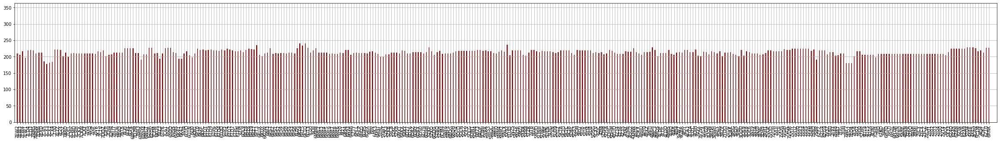

In [100]:
# plot of non NA residues per structure
import matplotlib.pyplot as plt
fig = plt.figure(figsize = (40, 5))

plt.bar([x[:4] for x in ml_df.columns[1:]], ml_df.describe().iloc[0,1:], color ='maroon', width = 0.4)
plt.xticks(rotation = 90)
plt.xlim([-1,len([x[:4] for x in ml_df.columns[1:]])])
plt.ylim(0,364)
plt.grid(None)
plt.show()


In [101]:
len(ml_df)

332

---
# Machine Learning

In [102]:
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

In [103]:
# X has features, y has residues
X = ml_df.drop(['residue'], axis = 1)
y = ml_df['residue']
display(X)
ml_df_colnames = list(ml_df.columns)

,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,7EXD_intenergysum,...,6ZA8_intenergysum,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
328,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
329,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [104]:
# minimum energy
min(list(X.min()))

-39.702366

In [105]:
# Get names of columns with missing values
cols_with_missing = [col for col in X.columns if X[col].isnull().any()]

# Make new columns indicating what will be imputed
for col in cols_with_missing:
    X[col + '_was_missing'] = X[col].isnull()
    X[col + '_was_missing'] = X[col].isnull()
    
# get X column names
X_cols = X.columns

C:\Users\Greg\AppData\Local\Temp/ipykernel_4308/3549229824.py:6: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`



In [106]:
X

,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,7EXD_intenergysum,...,6ZA8_intenergysum_was_missing,5T04_intenergysum_was_missing,4XEE_intenergysum_was_missing,4XES_intenergysum_was_missing,4GRV_intenergysum_was_missing,5C1M_intenergysum_was_missing,4EJ4_intenergysum_was_missing,4DKL_intenergysum_was_missing,6Z10_intenergysum_was_missing,6RNK_intenergysum_was_missing
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,True,True,True,True,True,True,True,True,False,False
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,True,True,True,True,True,True,True,True,False,False
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,True,True,True,True,True,True,True,True,False,False
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,True,True,True,True,True,True,True,True,False,False
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,True,True,True,True,True,True,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,...,True,True,True,True,True,True,True,True,True,True
328,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,...,True,True,True,True,True,True,True,True,True,True
329,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,True,True,True,True,True,True,True,True,True,True
330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,True,True,True,True,True,True,True,True,True,True


In [107]:
len(cols_with_missing)

364

In [108]:
# impute data
from sklearn.impute import SimpleImputer
# my_imputer = SimpleImputer(strategy='constant', fill_value = 999)
my_imputer = SimpleImputer()
X = pd.DataFrame(my_imputer.fit_transform(X))

# scale data
# scaler = StandardScaler()
# to_scale = [col for col in X.columns.values]
# scaler.fit(X[to_scale])
# X[to_scale] = scaler.transform(X[to_scale])

# # predict z-scores on the test set
# X[to_scale] = scaler.transform(X[to_scale]) 

# rename X columns
# X.set_axis(ml_df_colnames[1:], axis = 1, inplace = True)
X.columns = X_cols

# display scaled values
display(X)

,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,7EXD_intenergysum,...,6ZA8_intenergysum_was_missing,5T04_intenergysum_was_missing,4XEE_intenergysum_was_missing,4XES_intenergysum_was_missing,4GRV_intenergysum_was_missing,5C1M_intenergysum_was_missing,4EJ4_intenergysum_was_missing,4DKL_intenergysum_was_missing,6Z10_intenergysum_was_missing,6RNK_intenergysum_was_missing
0,-0.049177,-0.04709,-0.008756,-0.022449,-0.038813,-0.044545,-0.036073,-0.017949,-0.000943,-0.112813,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0
1,-0.049177,-0.04709,-0.008756,-0.022449,-0.038813,-0.044545,-0.036073,-0.017949,-0.000943,-0.112813,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0
2,-0.049177,-0.04709,-0.008756,-0.022449,-0.038813,-0.044545,-0.036073,-0.017949,-0.000943,-0.112813,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0
3,-0.049177,-0.04709,-0.008756,-0.022449,-0.038813,-0.044545,-0.036073,-0.017949,-0.000943,-0.112813,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0
4,-0.049177,-0.04709,-0.008756,-0.022449,-0.038813,-0.044545,-0.036073,-0.017949,-0.000943,-0.112813,...,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,-0.049177,-0.04709,0.000000,-0.022449,0.000000,0.000000,0.000000,-0.017949,-0.000943,-0.112813,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
328,-0.049177,-0.04709,0.000000,-0.022449,0.000000,0.000000,0.000000,-0.017949,-0.000943,-0.112813,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
329,-0.049177,-0.04709,0.000000,-0.022449,-0.038813,-0.044545,-0.036073,-0.017949,-0.000943,-0.112813,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
330,-0.049177,-0.04709,-0.008756,-0.022449,-0.038813,-0.044545,-0.036073,-0.017949,-0.000943,-0.112813,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [109]:
X.to_pickle('pickles/X_imputed_refresh_nonclipped.pkl')
y.to_pickle('pickles/y_intresidues_refresh_nonclipped.pkl')

### initial PCA visualization

In [133]:
#imports
import plotly as py
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X)

In [134]:
pca_df = pd.DataFrame(data = principalComponents, columns = ['pc1', 'pc2'])

In [135]:
pca_df = pca_df.sort_values(by='pc1')

In [136]:
pca_df.reset_index(inplace=True)

In [137]:
#trace1 is for 'Cluster 0'
trace = go.Scatter(
                    x = pca_df['pc1'],
                    y = pca_df['pc2'],
                    mode = "markers",
                    name = "pca_df",
                    marker = dict(size = 10, line=dict(width=1,color='Black')),
                    text = None)



layout = dict(xaxis= dict(title= 'PC1',zeroline= False),
              yaxis= dict(title= 'PC2',zeroline= False),
              font_family="Arial",
              font = dict(size=16),
              width=800,
              height=800
             )

fig = dict(data = trace, layout = layout)

iplot(fig)

### Mean Shift Clustering

In [138]:
bandwidth = estimate_bandwidth(X, quantile=0.3, n_samples=len(X))

ms = MeanShift(bandwidth = bandwidth)
ms.fit(X)
labels = ms.labels_
cluster_centers = ms.cluster_centers_
 
labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)
 
# Print the number of clusters in the data
print("Clusters found: %d" % n_clusters_)

Clusters found: 40


In [139]:
ml_df['cluster_labels'] = labels

In [140]:
# ml_df.to_csv('ml_df_meanshift_clustering_results.csv')

In [141]:
np.nanmean(ml_df.loc[ml_df['cluster_labels'] == 1].iloc[:, 1:])

0.03737297704554009

In [142]:
uniq_labels = list(ml_df['cluster_labels'].unique())
uniq_labels.sort()

for i in uniq_labels:
    print('\nCluster', i)
    display(ml_df.loc[ml_df['cluster_labels'] == i])
    print('Mean interaction energy for cluster', str(i) + ':', np.nanmean(ml_df.loc[ml_df['cluster_labels'] == i].iloc[:, 1:]), '\n')


Cluster 0


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
11,1.32,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
12,1.33,0.0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
13,1.34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
14,1.35,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
15,1.36,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312,7.49,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
313,7.50,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
314,7.51,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
315,7.52,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Mean interaction energy for cluster 0: -0.0049174775465853455 


Cluster 1


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
0,1.21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1
1,1.22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1
2,1.23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1
3,1.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1
4,1.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,7.64,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
328,7.65,NaN,NaN,0.0,NaN,0.0,0.0,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
329,7.66,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
330,7.67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


Mean interaction energy for cluster 1: 0.03737297704554009 


Cluster 2


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
237,6.22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
238,6.23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
239,6.24,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
240,6.25,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,2
241,6.26,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,2
242,6.27,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,2
243,6.28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,NaN,0.0,NaN,NaN,2


Mean interaction energy for cluster 2: 0.016 


Cluster 3


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
317,7.54,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
318,7.55,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,NaN,NaN,0.0,0.0,0.0,NaN,NaN,3
319,7.56,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,3


Mean interaction energy for cluster 3: 0.011583011583011582 


Cluster 4


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
8,1.29,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4
9,1.30,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4


Mean interaction energy for cluster 4: 0.02219020172910663 


Cluster 5


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
182,5.40,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5


Mean interaction energy for cluster 5: -0.12063508254794521 


Cluster 6


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
161,4.60,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6


Mean interaction energy for cluster 6: -0.07017045610795455 


Cluster 7


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
56,2.50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7


Mean interaction energy for cluster 7: -0.043397273972602735 


Cluster 8


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
18,1.39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-5.2,-4.6,8


Mean interaction energy for cluster 8: -0.06060606121212121 


Cluster 9


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
274,6.59,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9


Mean interaction energy for cluster 9: -0.1488304894117647 


Cluster 10


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
273,6.58,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,-0.9,0.0,0.0,0.0,10


Mean interaction energy for cluster 10: -0.13817304723646726 


Cluster 11


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
303,7.40,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11


Mean interaction energy for cluster 11: -0.3782997766758241 


Cluster 12


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
267,6.52,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12


Mean interaction energy for cluster 12: -0.21232876797260278 


Cluster 13


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
90,3.32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.2,0.0,...,0.0,0.0,0.0,0.0,-18.149555,-14.874034,-19.628372,-0.4,-0.4,13


Mean interaction energy for cluster 13: -5.403144966602738 


Cluster 14


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
69,2.63,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.6,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.1,14


Mean interaction energy for cluster 14: -0.048080845287671245 


Cluster 15


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
184,5.42,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.451371,0.0,...,0.0,0.0,0.0,0.0,-0.2,0.0,0.0,0.0,0.0,15


Mean interaction energy for cluster 15: -0.2668155364383561 


Cluster 16


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
299,7.36,0.0,0.0,0.0,0.0,0.0,0.0,-0.3,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16


Mean interaction energy for cluster 16: -0.08925636719780225 


Cluster 17


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
269,6.54,0.0,0.0,0.0,0.0,0.0,0.0,-5.6,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17


Mean interaction energy for cluster 17: -0.15662322693150685 


Cluster 18


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
210,5.68,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,18
275,6.60,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18


Mean interaction energy for cluster 18: 0.06691727441729323 


Cluster 19


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
306,7.43,0.0,0.0,0.0,0.0,-0.6,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.1,0.0,-0.2,0.0,0.0,19


Mean interaction energy for cluster 19: -0.17686721657534235 


Cluster 20


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
298,7.35,0.0,0.0,0.0,NaN,0.0,0.0,-0.1,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,-0.1,0.0,0.0,20


Mean interaction energy for cluster 20: -0.24779263267605622 


Cluster 21


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
302,7.39,0.0,0.0,0.0,-0.2,0.0,-0.3,0.0,-0.1,0.0,...,0.0,0.0,0.0,0.0,0.0,-0.1,0.0,-9.96928,-12.189508,21


Mean interaction energy for cluster 21: -1.9956863845054948 


Cluster 22


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
295,7.32,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22


Mean interaction energy for cluster 22: -0.023404256322188465 


Cluster 23


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
185,5.43,0.0,0.0,-0.2,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,23


Mean interaction energy for cluster 23: 0.007453314958904089 


Cluster 24


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
94,3.36,0.0,0.0,-0.3,-0.1,-0.2,-0.1,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-2.1,-0.7,-0.7,0.0,0.0,24


Mean interaction energy for cluster 24: -0.13232876654794526 


Cluster 25


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
266,6.51,0.0,0.0,-0.3,-0.1,-1.2,-1.6,0.0,-1.4,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.2,25


Mean interaction energy for cluster 25: -0.2465753436986302 


Cluster 26


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
270,6.55,0.0,0.0,-0.4,-0.1,-6.1,-6.6,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.8,-1.7,-1.1,0.0,0.0,26


Mean interaction energy for cluster 26: -1.3141574039560442 


Cluster 27


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
66,2.60,0.0,-0.1,0.0,-1.8,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.3,0.0,0.0,-0.3,-0.7,27


Mean interaction energy for cluster 27: -0.2178429611232878 


Cluster 28


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
10,1.31,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-23.808136,28


Mean interaction energy for cluster 28: -0.35946294893617026 


Cluster 29


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
71,2.65,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,29


Mean interaction energy for cluster 29: -0.032763533703703704 


Cluster 30


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
177,5.35,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,-0.6,0.0,0.0,30


Mean interaction energy for cluster 30: 0.0930086074742268 


Cluster 31


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
164,4.63,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0.0,0.0,31


Mean interaction energy for cluster 31: 0.1225296442687747 


Cluster 32


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
277,6.62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32


Mean interaction energy for cluster 32: 0.7756935686956522 


Cluster 33


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
73,2.67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,-0.1,-0.3,NaN,NaN,NaN,0.0,-0.1,33


Mean interaction energy for cluster 33: 0.14069264064935064 


Cluster 34


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
79,3.21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,34


Mean interaction energy for cluster 34: -0.02846 


Cluster 35


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
173,5.31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,35


Mean interaction energy for cluster 35: 0.6821458278260869 


Cluster 36


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
91,3.33,-0.1,0.0,-0.5,0.0,-0.1,-0.1,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.3,-0.6,-0.2,0.0,0.0,36


Mean interaction energy for cluster 36: -0.34246580975342455 


Cluster 37


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
86,3.28,-1.133249,-0.865499,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,37


Mean interaction energy for cluster 37: 0.028444890273972588 


Cluster 38


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
70,2.64,-2.3,-0.1,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-4.1,-5.3,38


Mean interaction energy for cluster 38: 0.016620498421052614 


Cluster 39


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
87,3.29,-6.744811,-8.58787,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.4,0.0,0.0,-0.6,-0.7,39


Mean interaction energy for cluster 39: -0.14779006241095888 



#### Plotting Heatmap Sorted by Mean Shift Clustering Results

In [143]:
import pickle

# get protein names from pickled file
with open('pickles/protein_names.pkl', "rb") as f:
    protein_names = pickle.load(f)    

# assign variable containing PDB IDs for all structures
PDBids = []
for col in X.columns:
    PDBids.append(col[:4])

# assign variable with states for all structures
states = df['State']

In [144]:
# generate name/state/function labels
protein_NSF = []
for i in range(len(df)):
    name = protein_names[i]
    state = df.iloc[i, 1]
    function = df.iloc[i, 2]
    NSF = name + ' (' + state + ', ' + function + ')'
    protein_NSF.append(NSF)

In [145]:
# generate name/PDBID labels
protein_NPDB = []
for i in range(len(df)):
    name = protein_names[i]
    PDB = PDBids[i]
    NPDB = name + ' (' + PDB + ')'
    protein_NPDB.append(NPDB)

In [146]:
# determine where to place row lines
uniqs = np.unique(ms.labels_, return_counts=True)
line_count = 0
row_line_markers = []
for i in list(uniqs[1]):
    line_count += i
    row_line_markers.append(line_count)
    #print(line_count)
    
print(row_line_markers)

[173, 284, 291, 294, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332]


In [147]:
X['cluster_labels'] = labels
X['resnums'] = resnums

In [148]:
df = pd.read_csv('data/364_interaction_energies_state_function_v4.txt', sep='\t')
df.drop('index', axis = 1, inplace=True)
structure_df = df.copy()

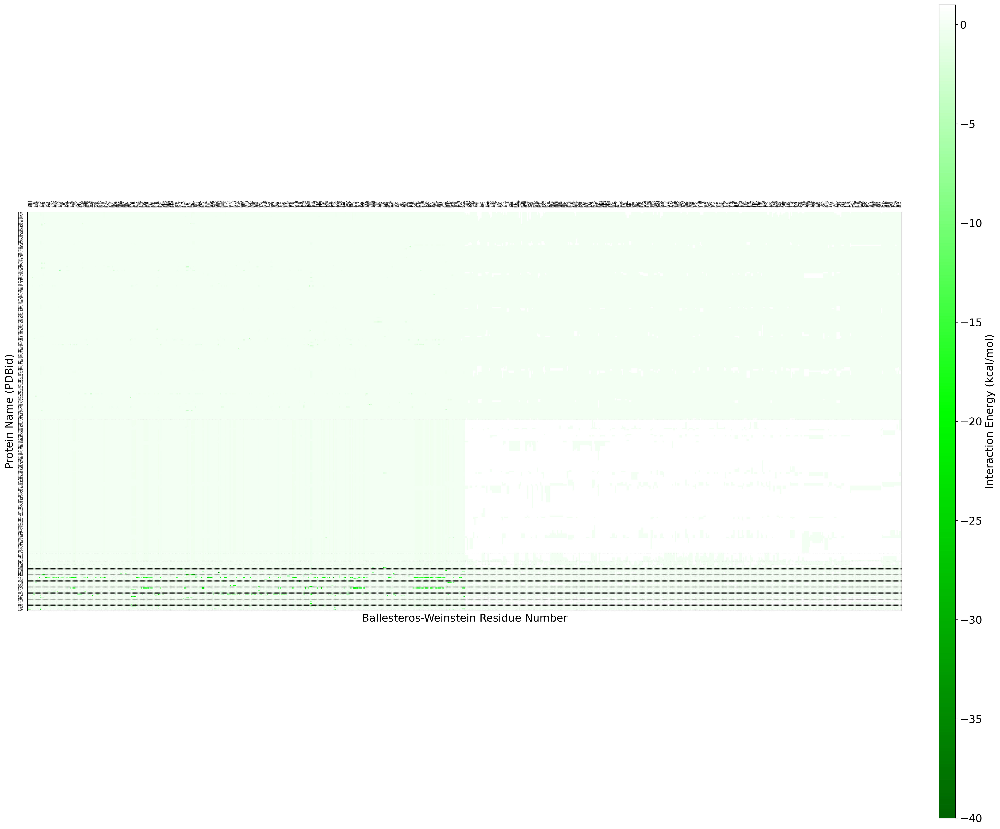

In [151]:
# plot cluster heatmap (all residues)

#imports
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# copy X to plotX, sort by cluster labels then protein names
plotX = X.copy()
plotX.sort_values(by = ['cluster_labels', 'resnums'], ascending = [True, True], na_position = 'first', inplace = True)
plotX.reset_index(inplace = True)
plotX.drop(['index'], axis = 1, inplace = True)

X_mat = plotX.drop(['cluster_labels', 'resnums'], axis = 1)

# convert some variables to numpy arrays for sorting
structure_df_np = structure_df.to_numpy()
X_mat_np = X_mat.to_numpy()
PDBids_np = np.array(PDBids)
resnums_np = np.array(resnums)
protein_names_np = np.array(protein_names)

# normalization and colormap
norm = plt.Normalize(-40,1)
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["darkgreen","lime","white"])

# plotting
matplotlib.rcParams['figure.figsize'] = [25,25] #width, height (both in inches)
matplotlib.rcParams['figure.dpi'] = 300 #width, height (both in inches)
fig = plt.figure(figsize=(25, 25), dpi = 300)
ax = fig.add_subplot(111)
cax = ax.matshow(X_mat, cmap=cmap, norm=norm)
ratio = X.shape[0]/X.shape[1]
cbar = fig.colorbar(cax, fraction=0.04*ratio, pad = 0.04, aspect = 50, shrink = 0.9)
cbar.set_label('Interaction Energy (kcal/mol)', rotation=90, fontsize = 16)
cbar.ax.tick_params(labelsize=16)
plt.yticks(np.arange(len(y)), list(plotX['resnums']), fontsize = 3.5)
plt.xticks(np.arange(len(X_mat.columns)), PDBids, fontsize = 3.5, rotation = 90)
plt.xlim([-1,len(PDBids)])
plt.ylim([-1,len(resnums)])
plt.xlabel("Ballesteros-Weinstein Residue Number", fontsize = 16)
plt.ylabel("Protein Name (PDBid)", fontsize = 16)
plt.gca().invert_yaxis()
#plt.gca().xaxis.set_label_position('top') 


# row lines
for i in row_line_markers:
     plt.axhline(y = i - 0.5, color='black', linestyle='dashed', linewidth = 0.25)


# remove tick marks, keep labels        
plt.gca().tick_params(
    axis='both',          # changes apply to both axes
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    right=False,
    labelbottom=False) # labels along the bottom edge are off
        
plt.show()

In [56]:
ml_df.drop(['cluster_labels'], axis = 1, inplace = True)

### K Means Clustering

In [57]:
from sklearn.cluster import KMeans
rng = 1

#### Silhouette Analysis

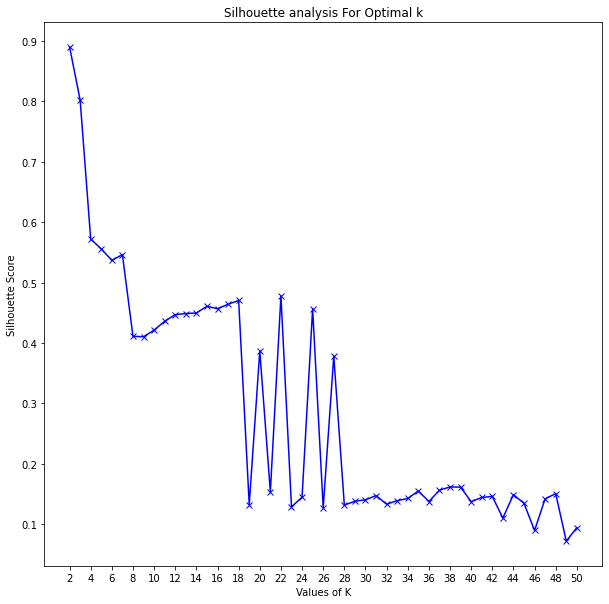

In [58]:
from matplotlib import pyplot as plt
from sklearn.metrics import silhouette_score

silhouette_avg = []
kmax = 50
for k in range(2, kmax+1):
    # initialise kmeans
    kmeans = KMeans(n_clusters=k, random_state = rng)
    kmeans.fit(X)
    cluster_labels = kmeans.labels_

    # silhouette score
    silhouette_avg.append(silhouette_score(X, cluster_labels))
    
plt.gcf().set_size_inches(10,10)
plt.gcf().set_dpi(72)   
plt.plot(list(range(2, kmax+1)),silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette Score') 
plt.xticks(range(2, kmax+1, 2))
plt.title('Silhouette analysis For Optimal k')
plt.show()

#### Elbow Method

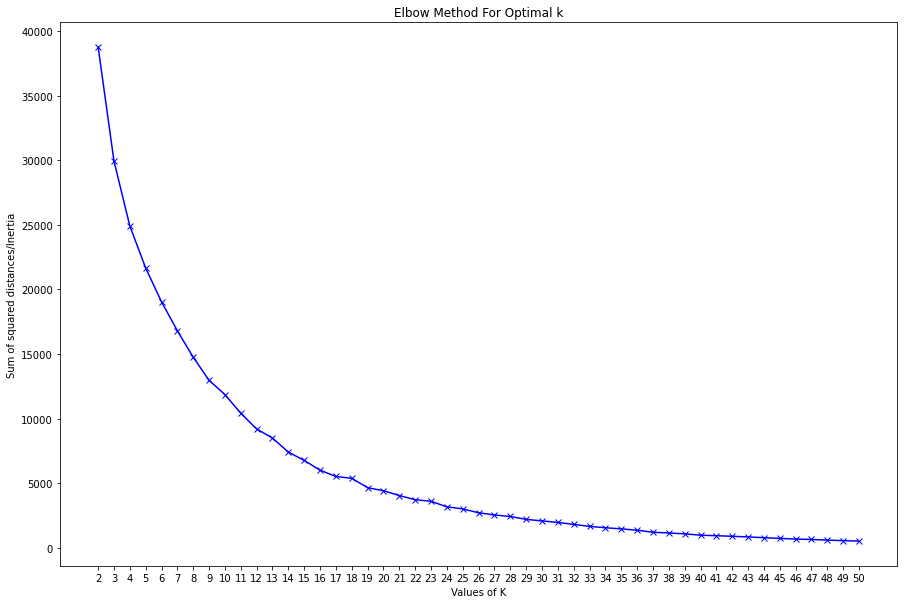

In [59]:
Sum_of_squared_distances = []
K = range(2,51)
for num_clusters in K :
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(X)
    Sum_of_squared_distances.append(kmeans.inertia_)
    
plt.gcf().set_size_inches(15,10)
plt.gcf().set_dpi(72)    
plt.plot(K,Sum_of_squared_distances,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Sum of squared distances/Inertia') 
plt.xticks(range(2, 51, 1))
plt.title('Elbow Method For Optimal k')
plt.show()

In [60]:
clustering = KMeans(n_clusters=17, random_state=rng)
clustering.fit(X)
labels = clustering.labels_
ml_df['cluster_labels'] = labels

In [61]:
# ml_df.to_csv('ml_df_kmeans_clustering_results.csv')

In [62]:
uniq_labels = list(ml_df['cluster_labels'].unique())
uniq_labels.sort()

for i in uniq_labels:
    print('\nCluster', i)
    display(ml_df.loc[ml_df['cluster_labels'] == i])


Cluster 0


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
3,1.34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,1.35,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
5,1.36,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
6,1.38,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
7,1.39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-5.2,-4.6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108,7.41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
109,7.42,0.0,0.0,0.0,0.0,-0.1,-0.1,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
111,7.45,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
112,7.46,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0



Cluster 1


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
38,3.32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.2,0.0,...,0.0,0.0,0.0,0.0,-18.149555,-14.874034,-19.628372,-0.4,-0.4,1



Cluster 2


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
106,7.39,0.0,0.0,0.0,-0.2,0.0,-0.3,0.0,-0.1,0.0,...,0.0,0.0,0.0,0.0,0.0,-0.1,0.0,-9.96928,-12.189508,2



Cluster 3


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
89,6.55,0.0,0.0,-0.4,-0.1,-6.1,-6.6,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.8,-1.7,-1.1,0.0,0.0,3



Cluster 4


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
2,1.31,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-23.808136,4



Cluster 5


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
0,1.27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,5
1,1.30,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
29,2.68,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
60,4.64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,5
61,4.66,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,5
94,6.61,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
95,6.62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
96,7.28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,...,0.0,0.0,0.0,0.0,NaN,0.0,NaN,0.0,0.0,5
97,7.30,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
98,7.31,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5



Cluster 6


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
107,7.40,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6



Cluster 7


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
39,3.33,-0.1,0.0,-0.5,0.0,-0.1,-0.1,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.3,-0.6,-0.2,0.0,0.0,7
99,7.32,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7



Cluster 8


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
110,7.43,0.0,0.0,0.0,0.0,-0.6,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.1,0.0,-0.2,0.0,0.0,8



Cluster 9


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
92,6.59,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9



Cluster 10


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
88,6.54,0.0,0.0,0.0,0.0,0.0,0.0,-5.6,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10



Cluster 11


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
42,3.36,0.0,0.0,-0.3,-0.1,-0.2,-0.1,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-2.1,-0.7,-0.7,0.0,0.0,11
62,5.31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,11
63,5.35,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,-0.6,0.0,0.0,11



Cluster 12


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
21,2.60,0.0,-0.1,0.0,-1.8,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.3,0.0,0.0,-0.3,-0.7,12



Cluster 13


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
30,3.21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,13
102,7.35,0.0,0.0,0.0,NaN,0.0,0.0,-0.1,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,-0.1,0.0,0.0,13



Cluster 14


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
67,5.40,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14



Cluster 15


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
36,3.29,-6.744811,-8.58787,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.4,0.0,0.0,-0.6,-0.7,15



Cluster 16


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
103,7.36,0.0,0.0,0.0,0.0,0.0,0.0,-0.3,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16


In [64]:
ml_df.drop(['cluster_labels'], axis = 1, inplace = True)

### Agglomerative Clustering

In [65]:
from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=17, affinity='euclidean', linkage='ward')
labels = cluster.fit_predict(X)
ml_df['cluster_labels'] = labels

In [66]:
# ml_df.to_csv('ml_df_agglomerative_clustering_results.csv')

In [67]:
uniq_labels = list(ml_df['cluster_labels'].unique())
uniq_labels.sort()

for i in uniq_labels:
    print('\nCluster', i)
    display(ml_df.loc[ml_df['cluster_labels'] == i])


Cluster 0


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
24,2.63,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.6,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.1,0
39,3.33,-0.1,0.0,-0.5,0.0,-0.1,-0.1,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.3,-0.6,-0.2,0.0,0.0,0
42,3.36,0.0,0.0,-0.3,-0.1,-0.2,-0.1,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-2.1,-0.7,-0.7,0.0,0.0,0
62,5.31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,0
63,5.35,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,-0.6,0.0,0.0,0
69,5.42,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.451371,0.0,...,0.0,0.0,0.0,0.0,-0.2,0.0,0.0,0.0,0.0,0



Cluster 1


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
1,1.30,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
3,1.34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4,1.35,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
5,1.36,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
6,1.38,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108,7.41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
109,7.42,0.0,0.0,0.0,0.0,-0.1,-0.1,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
111,7.45,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
112,7.46,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1



Cluster 2


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
110,7.43,0.0,0.0,0.0,0.0,-0.6,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.1,0.0,-0.2,0.0,0.0,2



Cluster 3


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
0,1.27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,3
29,2.68,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
60,4.64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,3
61,4.66,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,3
94,6.61,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
95,6.62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
96,7.28,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,NaN,0.0,NaN,0.0,0.0,3
97,7.30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
98,7.31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3



Cluster 4


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
30,3.21,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,4
102,7.35,0.0,0.0,0.0,0.0,0.0,0.0,-0.1,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,-0.1,0.0,0.0,4



Cluster 5


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
107,7.40,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5



Cluster 6


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
67,5.40,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6



Cluster 7


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
103,7.36,0.0,0.0,0.0,0.0,0.0,0.0,-0.3,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7



Cluster 8


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
92,6.59,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8



Cluster 9


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
89,6.55,0.0,0.0,-0.4,-0.1,-6.1,-6.6,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.8,-1.7,-1.1,0.0,0.0,9



Cluster 10


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
36,3.29,-6.744811,-8.58787,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.4,0.0,0.0,-0.6,-0.7,10



Cluster 11


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
106,7.39,0.0,0.0,0.0,-0.2,0.0,-0.3,0.0,-0.1,0.0,...,0.0,0.0,0.0,0.0,0.0,-0.1,0.0,-9.96928,-12.189508,11



Cluster 12


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
88,6.54,0.0,0.0,0.0,0.0,0.0,0.0,-5.6,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12



Cluster 13


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
2,1.31,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-23.808136,13



Cluster 14


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
21,2.60,0.0,-0.1,0.0,-1.8,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.3,0.0,0.0,-0.3,-0.7,14



Cluster 15


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
38,3.32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.2,0.0,...,0.0,0.0,0.0,0.0,-18.149555,-14.874034,-19.628372,-0.4,-0.4,15



Cluster 16


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
14,2.50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16


In [57]:
ml_df.drop(['cluster_labels'], axis = 1, inplace = True)

### Gaussian Mixture Model

In [58]:
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=2)
labels = gmm.fit_predict(X)

In [59]:
ml_df['cluster_labels'] = labels

In [60]:
uniq_labels = list(ml_df['cluster_labels'].unique())
uniq_labels.sort()

for i in uniq_labels:
    print('\nCluster', i)
    display(ml_df.loc[ml_df['cluster_labels'] == i])


Cluster 0


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
0,1.27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0
1,1.30,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,1.31,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-23.808136,0
3,1.34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,1.35,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109,7.42,0.0,0.0,0.0,0.0,-0.1,-0.1,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
110,7.43,0.0,0.0,0.0,0.0,-0.6,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.1,0.0,-0.2,0.0,0.0,0
111,7.45,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
112,7.46,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0



Cluster 1


,residue,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,...,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum,cluster_labels
38,3.32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.2,0.0,...,0.0,0.0,0.0,0.0,-18.149555,-14.874034,-19.628372,-0.4,-0.4,1


## TSNE

In [68]:
plotX = X.copy()

#plotly imports
import plotly as py
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

# TSNE import
from sklearn.manifold import TSNE

#T-SNE with two principal components
TSNE_2d = TSNE(n_components=2, init='random')

clusters = ml_df['cluster_labels']
PCs_2d = pd.DataFrame(TSNE_2d.fit_transform(plotX))
PCs_2d.columns = ["PC1_2d", "PC2_2d"]
plotX['clusters'] = clusters
plotX['PC1_2d'] = PCs_2d['PC1_2d']
plotX['PC2_2d'] = PCs_2d['PC2_2d']

uniq_clusters = plotX['clusters'].unique()
uniqs = uniq_clusters.tolist()
uniqs.sort()

traces = []

for cluster in uniqs:
    cluster_data = plotX[plotX['clusters'] == cluster]

    #trace1 is for 'Cluster 0'
    trace = go.Scatter(
                        x = cluster_data["PC1_2d"],
                        y = cluster_data["PC2_2d"],
                        mode = "markers",
                        name = "Cluster " + str(cluster),
                        marker = dict(size = 10, line=dict(width=1,color='Black')),
                        text = None)

    traces.append(trace)



layout = dict(xaxis= dict(title= 'Dimension 1',zeroline= False),
              yaxis= dict(title= 'Dimension 2',zeroline= False),
              font_family="Arial",
              font = dict(size=16),
              width=800,
              height=800
             )

fig = dict(data = traces, layout = layout)

iplot(fig)

# CLUSTERING BY STRUCTURE

In [62]:
df = pd.read_csv('data/364_interaction_energies_state_function_v3.txt', sep='\t')
df.drop('index', axis = 1, inplace=True)
structure_df = df.copy()

In [63]:
# encode interaction types as integers (only necessary if inttype1/2 columns are in the dataframe)

if any("type" in s for s in list(ml_df.columns)):

    # create instance of labelencoder
    labelencoder = LabelEncoder()

    # get columns with 'type' in their name
    cols = [col for col in structure_df.columns if 'type' in col]

    # loop though all columns and convert strings to categorical integer variables
    for col in cols:
        structure_df[col] = labelencoder.fit_transform(structure_df[col])


    # encode states as integers
    # get columns with 'type' in their name
    cols = [col for col in structure_df.columns if 'State' in col]

    # loop though all columns and convert strings to categorical integer variables
    for col in cols:
        structure_df[col] = labelencoder.fit_transform(structure_df[col])

    # encode functions as integers
    # get columns with 'type' in their name
    cols = [col for col in structure_df.columns if 'Function' in col]

    # loop though all columns and convert strings to categorical integer variables
    for col in cols:
        structure_df[col] = labelencoder.fit_transform(structure_df[col])

In [64]:
structure_df.columns

Index(['PDBID', 'State', 'Function', '1.21_intenergysum', '1.21_inttype1',
       '1.21_intenergy1', '1.21_inttype2', '1.21_intenergy2',
       '1.22_intenergysum', '1.22_inttype1',
       ...
       '7.67_intenergysum', '7.67_inttype1', '7.67_intenergy1',
       '7.67_inttype2', '7.67_intenergy2', '7.68_intenergysum',
       '7.68_inttype1', '7.68_intenergy1', '7.68_inttype2', '7.68_intenergy2'],
      dtype='object', length=1663)

In [65]:
# drop non-intenergysum columns
for col in structure_df.columns[1:]:
    if 'intenergysum' not in col:
        structure_df.drop(col, axis = 1, inplace = True)
        
# drop columns from df if no interactions are made at that residue
for resnum in non_int_resnums:
    for col in structure_df.columns:
        if resnum in col:
            structure_df.drop([col], axis = 1, inplace = True)

In [66]:
structure_df

,PDBID,1.27_intenergysum,1.30_intenergysum,1.31_intenergysum,1.34_intenergysum,1.35_intenergysum,1.36_intenergysum,1.38_intenergysum,1.39_intenergysum,1.42_intenergysum,...,7.37_intenergysum,7.38_intenergysum,7.39_intenergysum,7.40_intenergysum,7.41_intenergysum,7.42_intenergysum,7.43_intenergysum,7.45_intenergysum,7.46_intenergysum,7.47_intenergysum
0,7EW2,NaN,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,7EW3,NaN,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,7EW4,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,7EW1,NaN,NaN,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,-0.200000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,7LD4,NaN,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,-0.1,-0.6,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359,5C1M,NaN,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,-0.1,0.0,0.0,0.0
360,4EJ4,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,-0.100000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
361,4DKL,NaN,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,-0.2,0.0,0.0,0.0
362,6Z10,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,-5.2,0.0,...,0.0,0.0,-9.969280,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [67]:
X = structure_df.drop(['PDBID'], axis = 1)
y = structure_df['PDBID']
display(X)

,1.27_intenergysum,1.30_intenergysum,1.31_intenergysum,1.34_intenergysum,1.35_intenergysum,1.36_intenergysum,1.38_intenergysum,1.39_intenergysum,1.42_intenergysum,1.43_intenergysum,...,7.37_intenergysum,7.38_intenergysum,7.39_intenergysum,7.40_intenergysum,7.41_intenergysum,7.42_intenergysum,7.43_intenergysum,7.45_intenergysum,7.46_intenergysum,7.47_intenergysum
0,NaN,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,NaN,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,NaN,NaN,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,-0.200000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,NaN,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,-0.1,-0.6,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359,NaN,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,-0.1,0.0,0.0,0.0
360,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,-0.100000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
361,NaN,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,-0.2,0.0,0.0,0.0
362,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,-5.2,0.0,0.0,...,0.0,0.0,-9.969280,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [68]:
# get colnames
colnames = list(X.columns)

# impute data
from sklearn.impute import SimpleImputer
# my_imputer = SimpleImputer(strategy='constant', fill_value=1)
my_imputer = SimpleImputer()
X = pd.DataFrame(my_imputer.fit_transform(X))

# #rename columns
X.columns = colnames

# display scaled values
display(X)

,1.27_intenergysum,1.30_intenergysum,1.31_intenergysum,1.34_intenergysum,1.35_intenergysum,1.36_intenergysum,1.38_intenergysum,1.39_intenergysum,1.42_intenergysum,1.43_intenergysum,...,7.37_intenergysum,7.38_intenergysum,7.39_intenergysum,7.40_intenergysum,7.41_intenergysum,7.42_intenergysum,7.43_intenergysum,7.45_intenergysum,7.46_intenergysum,7.47_intenergysum
0,-0.016667,0.0000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-0.016667,0.0000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-0.016667,-0.0015,-0.484801,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-0.016667,-0.0015,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,-0.200000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-0.016667,0.0000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,-0.1,-0.6,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359,-0.016667,0.0000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,-0.1,0.0,0.0,0.0
360,0.000000,0.0000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,-0.100000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
361,-0.016667,0.0000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,-0.2,0.0,0.0,0.0
362,0.000000,0.0000,0.000000,0.0,0.0,0.0,0.0,-5.2,0.0,0.0,...,0.0,0.0,-9.969280,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Mean Shift Clustering

In [69]:
bandwidth = estimate_bandwidth(X, quantile=0.2, n_samples=len(X))

ms = MeanShift(bandwidth = bandwidth)
ms.fit(X)
labels = ms.labels_
cluster_centers = ms.cluster_centers_
 
labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)
 
# Print the number of clusters in the data
print("Clusters found: %d" % n_clusters_)

Clusters found: 25


In [70]:
df['cluster_labels'] = labels

In [71]:
# display structures in each cluster
uniq_labels = list(df['cluster_labels'].unique())
uniq_labels.sort()

for i in uniq_labels:
    print('\nCluster', i)
    display(df.loc[df['cluster_labels'] == i])
    print(df.loc[df['cluster_labels'] == i]['State'].value_counts(), '\n')
    print(df.loc[df['cluster_labels'] == i]['Function'].value_counts())


Cluster 0


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
0,7EW2,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1,7EW3,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
2,7EW4,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
3,7EW1,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
4,7LD4,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353,6YVR,Inactive,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
355,5T04,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
356,4XEE,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
357,4XES,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


Inactive        127
Active           81
Intermediate      6
Other             1
Name: State, dtype: int64 

Antagonist           114
Agonist               91
Agonist (partial)      5
Inverse agonist        5
Name: Function, dtype: int64

Cluster 1


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
9,7EXD,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
14,7E32,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
15,7E2Z,Active,Agonist (partial),NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
16,7E2Y,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
21,7CMV,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,2VT4,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
347,6IQL,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
359,5C1M,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
360,4EJ4,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


Inactive        57
Active          31
Intermediate     7
Name: State, dtype: int64 

Agonist              44
Antagonist           36
Inverse agonist      12
Agonist (partial)     3
Name: Function, dtype: int64

Cluster 2


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
94,6NI3,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
100,6PS6,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
130,6GPS,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
131,6GPX,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
145,6AKX,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
146,6AKY,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
210,5JQH,Inactive,Inverse agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
231,4XNW,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
244,4MBS,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
271,3ODU,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2


Inactive        12
Intermediate     2
Active           1
Name: State, dtype: int64 

Antagonist         12
Inverse agonist     2
Agonist             1
Name: Function, dtype: int64

Cluster 3


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
12,7CX2,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
13,7CX4,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
132,6IIU,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
133,6IIV,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
136,6M9T,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
137,5YHL,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
138,5YWY,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3


Active          3
Intermediate    2
Inactive        2
Name: State, dtype: int64 

Antagonist    4
Agonist       3
Name: Function, dtype: int64

Cluster 4


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
86,6RZ8,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
87,6RZ6,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
88,6RZ9,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
89,6RZ7,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4


Intermediate    4
Name: State, dtype: int64 

Antagonist    4
Name: Function, dtype: int64

Cluster 5


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
168,5OLZ,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
171,5OM1,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
172,5OM4,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5


Inactive    3
Name: State, dtype: int64 

Antagonist    3
Name: Function, dtype: int64

Cluster 6


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
53,6KO5,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
299,7S8P,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
306,7NA8,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6


Active      2
Inactive    1
Name: State, dtype: int64 

Agonist       2
Antagonist    1
Name: Function, dtype: int64

Cluster 7


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
351,6Z8N,Intermediate,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7
352,6ZIN,Inactive,Inverse agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7


Intermediate    1
Inactive        1
Name: State, dtype: int64 

Agonist            1
Inverse agonist    1
Name: Function, dtype: int64

Cluster 8


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
159,5ZBH,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8
287,7VDH,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8


Inactive    1
Active      1
Name: State, dtype: int64 

Antagonist    1
Agonist       1
Name: Function, dtype: int64

Cluster 9


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
234,4PHU,Intermediate,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
237,4NTJ,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
349,6Z4Q,Inactive,Inverse agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9


Intermediate    2
Inactive        1
Name: State, dtype: int64 

Agonist            1
Antagonist         1
Inverse agonist    1
Name: Function, dtype: int64

Cluster 10


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
108,6K1Q,Inactive,Inverse agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10


Inactive    1
Name: State, dtype: int64 

Inverse agonist    1
Name: Function, dtype: int64

Cluster 11


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
363,6RNK,Intermediate,Antagonist,0.0,None,0.0,None,0.0,0.0,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11


Intermediate    1
Name: State, dtype: int64 

Antagonist    1
Name: Function, dtype: int64

Cluster 12


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
304,7F8U,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12


Inactive    1
Name: State, dtype: int64 

Antagonist    1
Name: Function, dtype: int64

Cluster 13


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
296,7VV6,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13


Active    1
Name: State, dtype: int64 

Agonist    1
Name: Function, dtype: int64

Cluster 14


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
350,6Z4S,Inactive,Inverse agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14


Inactive    1
Name: State, dtype: int64 

Inverse agonist    1
Name: Function, dtype: int64

Cluster 15


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
354,6ZA8,Intermediate,Agonist (partial),NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15


Intermediate    1
Name: State, dtype: int64 

Agonist (partial)    1
Name: Function, dtype: int64

Cluster 16


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
255,3V2Y,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16


Inactive    1
Name: State, dtype: int64 

Antagonist    1
Name: Function, dtype: int64

Cluster 17


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
348,5X33,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17


Inactive    1
Name: State, dtype: int64 

Antagonist    1
Name: Function, dtype: int64

Cluster 18


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
158,5ZBQ,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18


Inactive    1
Name: State, dtype: int64 

Antagonist    1
Name: Function, dtype: int64

Cluster 19


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
226,4Z36,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19


Inactive    1
Name: State, dtype: int64 

Antagonist    1
Name: Function, dtype: int64

Cluster 20


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
235,4PY0,Intermediate,Agonist (partial),NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20


Intermediate    1
Name: State, dtype: int64 

Agonist (partial)    1
Name: Function, dtype: int64

Cluster 21


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
236,4PXZ,Intermediate,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21


Intermediate    1
Name: State, dtype: int64 

Agonist    1
Name: Function, dtype: int64

Cluster 22


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
192,5TZR,Intermediate,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22


Intermediate    1
Name: State, dtype: int64 

Agonist    1
Name: Function, dtype: int64

Cluster 23


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
10,7C4S,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23


Active    1
Name: State, dtype: int64 

Agonist    1
Name: Function, dtype: int64

Cluster 24


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
256,3V2W,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24


Inactive    1
Name: State, dtype: int64 

Antagonist    1
Name: Function, dtype: int64


#### Plotting Heatmap Sorted by Mean Shift Clustering Results

In [72]:
import pickle

# get protein names from pickled file
with open('pickles/protein_names.pkl', "rb") as f:
    protein_names = pickle.load(f)    

# assign variable containing PDB IDs for all structures
PDBids = y

# assign variable with states for all structures
states = df['State']

In [73]:
# generate name/state/function labels
protein_NSF = []
for i in range(len(df)):
    name = protein_names[i]
    state = df.iloc[i, 1]
    function = df.iloc[i, 2]
    NSF = name + ' (' + state + ', ' + function + ')'
    protein_NSF.append(NSF)

In [74]:
# generate name/PDBID labels
protein_NPDB = []
for i in range(len(df)):
    name = protein_names[i]
    PDB = PDBids[i]
    NPDB = name + ' (' + PDB + ')'
    protein_NPDB.append(NPDB)

In [75]:
# determine where to place row lines
uniqs = np.unique(ms.labels_, return_counts=True)
line_count = 0
row_line_markers = []
for i in list(uniqs[1]):
    line_count += i
    row_line_markers.append(line_count)
    #print(line_count)
    
print(row_line_markers)

[215, 310, 325, 332, 336, 339, 342, 344, 346, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364]


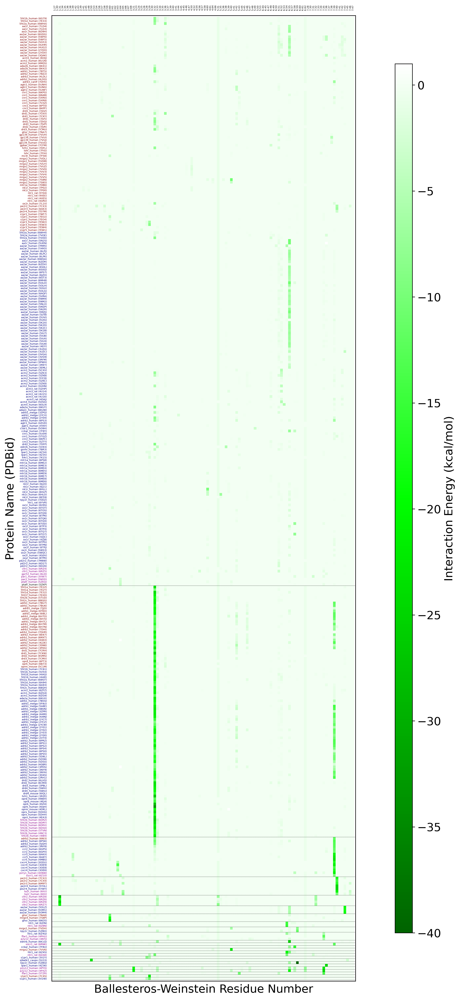

In [76]:
# plot cluster heatmap (all residues)

#imports
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# copy X to plotX, sort by cluster labels then protein names
plotX = X.copy()
plotX['PDBID'] = PDBids
plotX['protein_names'] = protein_names
plotX['cluster_labels'] = labels
plotX['protein_NPDB'] = protein_NPDB
plotX['states'] = states
plotX.sort_values(by = ['cluster_labels', 'states', 'protein_names'], ascending = [True, True, True], na_position = 'first', inplace = True)
plotX.reset_index(inplace = True)
plotX.drop(['index'], axis = 1, inplace = True)

X_mat = plotX.drop(['PDBID', 'protein_names', 'cluster_labels', 'protein_NPDB', 'states'], axis = 1)

# convert some variables to numpy arrays for sorting
structure_df_np = structure_df.to_numpy()
X_mat_np = X_mat.to_numpy()
PDBids_np = np.array(PDBids)
resnums_np = np.array(resnums)
protein_names_np = np.array(protein_names)

# normalization and colormap
norm = plt.Normalize(-40,1)
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["darkgreen","lime","white"])

# plotting
fig = plt.figure(figsize=(25, 25), dpi = 300)
ax = fig.add_subplot(111)
cax = ax.matshow(X_mat, cmap=cmap, norm=norm)
ratio = X.shape[0]/X.shape[1]
cbar = fig.colorbar(cax, fraction=0.04*ratio, pad = 0.04, aspect = 50, shrink = 0.9)
cbar.set_label('Interaction Energy (kcal/mol)', rotation=90, fontsize = 16)
cbar.ax.tick_params(labelsize=16)
plt.yticks(np.arange(len(y)), list(plotX['protein_NPDB']), fontsize = 3.5)
plt.xticks(np.arange(len(X_mat.columns)), resnums, fontsize = 3.5, rotation = 90)
plt.xlim([-1,len(resnums)])
plt.ylim([-1,len(PDBids)])
plt.xlabel("Ballesteros-Weinstein Residue Number", fontsize = 16)
plt.ylabel("Protein Name (PDBid)", fontsize = 16)
plt.gca().invert_yaxis()
#plt.gca().xaxis.set_label_position('top') 


# row lines
for i in row_line_markers:
     plt.axhline(y = i - 0.5, color='black', linestyle='dashed', linewidth = 0.25)


# remove tick marks, keep labels        
plt.gca().tick_params(
    axis='both',          # changes apply to both axes
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    right=False,
    labelbottom=False) # labels along the bottom edge are off

# color tick labels by activation state
for i in range(len(plotX['states'])):
    #print(i, plotX['PDBID'][i], plotX['states'][i])
    if plotX['states'][i] == 'Active':
        plt.gca().get_yticklabels()[i].set_color("maroon")
    elif plotX['states'][i] == 'Inactive':
        plt.gca().get_yticklabels()[i].set_color("navy")
    elif plotX['states'][i] == 'Intermediate':
        plt.gca().get_yticklabels()[i].set_color("darkmagenta")
    elif plotX['states'][i] == 'Other':
        plt.gca().get_yticklabels()[i].set_color("black")
        
plt.show()

In [77]:
# create new variables for plot data, plot resnums
X_mat_int = X_mat.copy()
plot_int_resnums = resnums.copy()

for col in X_mat_int.columns:
    if X_mat_int[col].min() == 0:
        X_mat_int.drop(col, axis = 1, inplace = True)
        plot_int_resnums.remove(col[0:4])
        

Cluster: 1


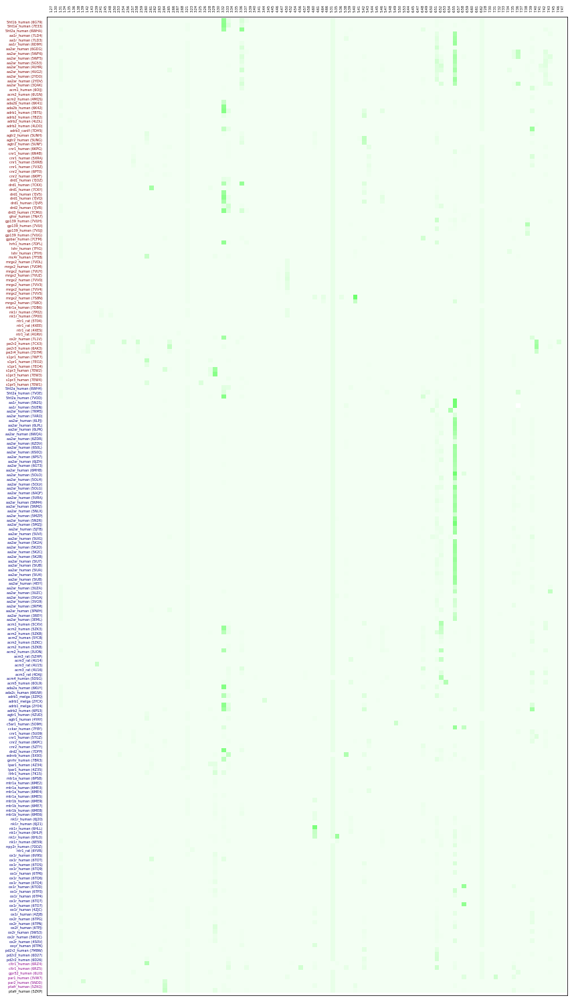

Cluster: 2


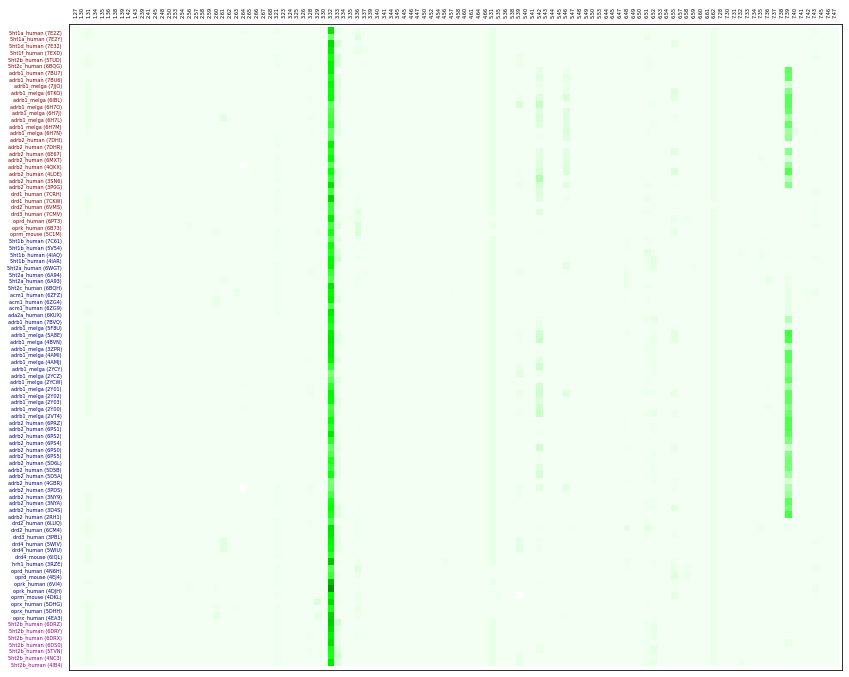

Cluster: 3


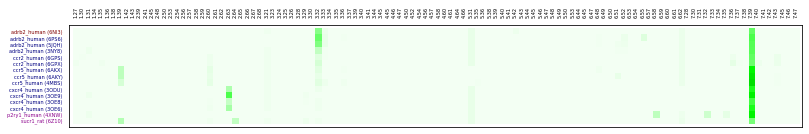

Cluster: 4


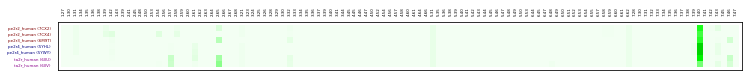

Cluster: 5


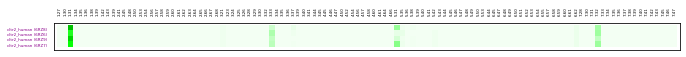

Cluster: 6


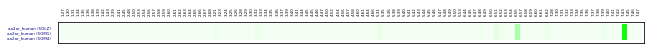

Cluster: 7


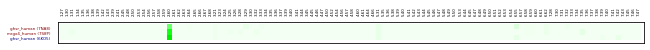

Cluster: 8


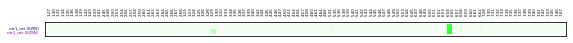

Cluster: 9


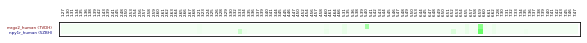

Cluster: 10


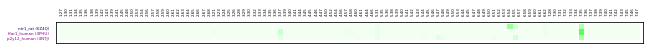

Cluster: 11


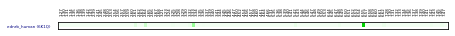

Cluster: 12


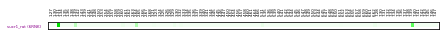

Cluster: 13


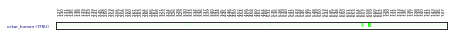

Cluster: 14


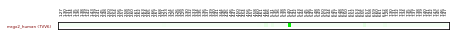

Cluster: 15


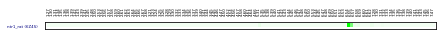

Cluster: 16


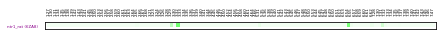

Cluster: 17


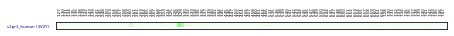

Cluster: 18


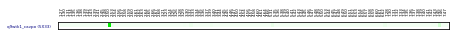

Cluster: 19


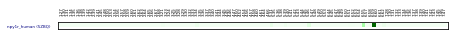

Cluster: 20


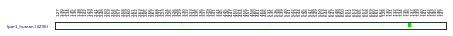

Cluster: 21


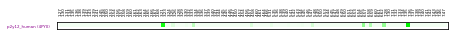

Cluster: 22


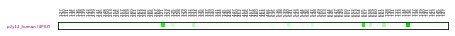

Cluster: 23


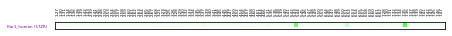

Cluster: 24


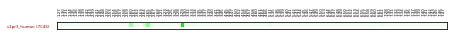

Cluster: 25


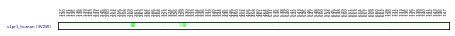

In [78]:
plt.close()
for i in range(len(row_line_markers)):
    x_labels = list(plotX['protein_NPDB'])
    plot_states = list(plotX['states'])
    
    print('Cluster:', i+1)
    # get data by cluster
    if i == 0:
        sub_X_mat_int = X_mat_int.iloc[0:row_line_markers[i], :]
        sub_x_labels = x_labels[0:row_line_markers[i]]
        sub_plot_states = plot_states[0:row_line_markers[i]]
    elif i == max(range(len(row_line_markers))):
        sub_X_mat_int = X_mat_int.iloc[row_line_markers[i] - 1:, :]
        sub_x_labels = x_labels[row_line_markers[i] - 1:]
        sub_plot_states = plot_states[row_line_markers[i] - 1:]
    else:
        sub_X_mat_int = X_mat_int.iloc[row_line_markers[i-1]:row_line_markers[i], :]
        sub_x_labels = x_labels[row_line_markers[i-1]:row_line_markers[i]]
        sub_plot_states = plot_states[row_line_markers[i-1]:row_line_markers[i]]
    
#     matplotlib.rcParams['figure.figsize'] = [25,len(sub_X_mat_int) / 10] #width, height (both in inches)
#     matplotlib.rcParams['figure.dpi'] = 300 #width, height (both in inches)


    # normalization and colormap
    norm = plt.Normalize(-40,1)
    cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["darkgreen","lime","white"])

    # plotting
    fig = plt.figure(figsize=(22,len(sub_X_mat_int) / 8))
#     fig = plt.figure()
    ax = fig.add_subplot(111)
    cax = ax.matshow(sub_X_mat_int, cmap=cmap, norm=norm)
    ratio = X.shape[0]/X.shape[1]
    if len(sub_X_mat_int) < 10:
        plt.yticks(np.arange(len(sub_x_labels)), sub_x_labels, fontsize = 4)
        plt.xticks(np.arange(len(sub_X_mat_int.columns)), plot_int_resnums, fontsize = 4, rotation = 90)
#         plt.xlabel("Ballesteros-Weinstein Residue Number", fontsize = 5)
#         plt.ylabel("Protein Name\n(PDBid)", fontsize = 5)
#         cbar = fig.colorbar(cax, fraction=0.04*ratio, pad = 0.04, shrink = 0.9)
#         cbar.set_label('Interaction Energy\n(kcal/mol)', rotation=90, fontsize = 6)
#         cbar.ax.tick_params(labelsize=6)
#         plt.title('Cluster ' + str(i+1), fontsize = 10)
    else:
        plt.yticks(np.arange(len(sub_x_labels)), sub_x_labels, fontsize = 5)
        plt.xticks(np.arange(len(sub_X_mat_int.columns)), plot_int_resnums, fontsize = 5, rotation = 90)
#         plt.xlabel("Ballesteros-Weinstein Residue Number", fontsize = 10)
#         plt.ylabel("Protein Name\n(PDBid)", fontsize = 10)
#         cbar = fig.colorbar(cax, fraction=0.04*ratio, pad = 0.04, aspect = 50, shrink = 0.9)
#         cbar.set_label('Interaction\nEnergy\n(kcal/mol)', rotation=90)
#         plt.title('Cluster ' + str(i+1)) 
        
        
    plt.xlim([-1,len(plot_int_resnums)])
    plt.ylim([-1,len(sub_x_labels)])
    ax.set_xlim(left = -1, right = len(plot_int_resnums))
    plt.gca().invert_yaxis()

    plt.gca().tick_params(
        axis='both',          # changes apply to both axes
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        left=False,
        right=False,
        labelbottom=False) # labels along the bottom edge are off

    # color tick labels by activation state
    for i in range(len(sub_plot_states)):
        if sub_plot_states[i] == 'Active':
            plt.gca().get_yticklabels()[i].set_color("maroon")
        elif sub_plot_states[i] == 'Inactive':
            plt.gca().get_yticklabels()[i].set_color("navy")
        elif sub_plot_states[i] == 'Intermediate':
            plt.gca().get_yticklabels()[i].set_color("darkmagenta")
        elif sub_plot_states[i] == 'Other':
            plt.gca().get_yticklabels()[i].set_color("black")    
    
    #plt.gcf().set_size_inches(20, len(sub_X_mat_int) / 10)
    plt.show()
    plt.close()

### K-means Clustering

In [423]:
from sklearn.cluster import KMeans
rng = 1

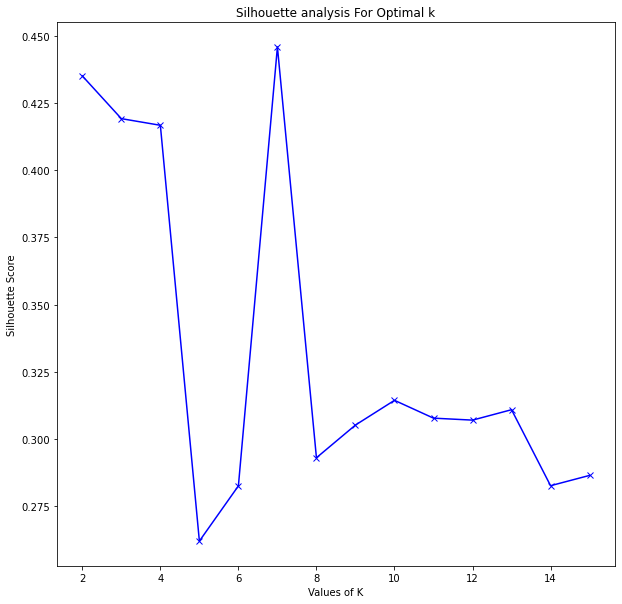

In [426]:
from sklearn.metrics import silhouette_score

silhouette_avg = []
kmax = 15
for k in range(2, kmax+1):
    # initialise kmeans
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    cluster_labels = kmeans.labels_

    # silhouette score
    silhouette_avg.append(silhouette_score(X, cluster_labels))
    
plt.gcf().set_size_inches(10,10)
plt.gcf().set_dpi(72)   
plt.plot(list(range(2, kmax+1)),silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette Score') 
plt.title('Silhouette analysis For Optimal k')
plt.show()

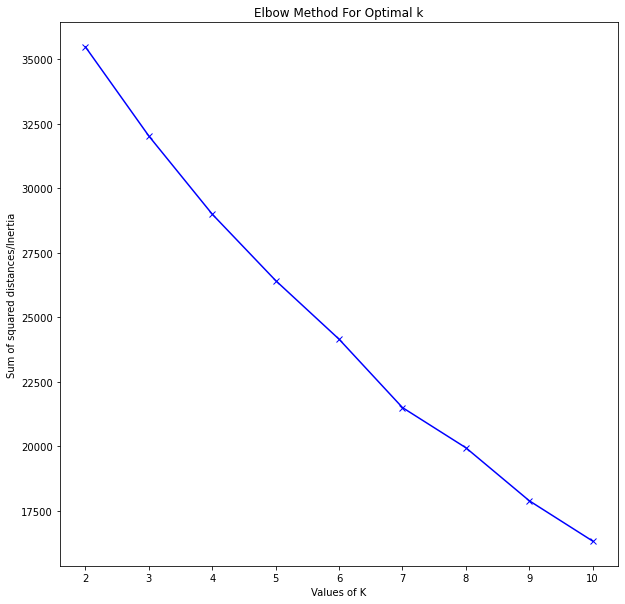

In [431]:
Sum_of_squared_distances = []
K = range(2,11)
for num_clusters in K :
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(X)
    Sum_of_squared_distances.append(kmeans.inertia_)
    
plt.gcf().set_size_inches(10,10)
plt.gcf().set_dpi(72)    
plt.plot(K,Sum_of_squared_distances,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Sum of squared distances/Inertia') 
plt.title('Elbow Method For Optimal k')
plt.show()

In [432]:
clustering = KMeans(n_clusters=7, random_state=rng)
clustering.fit(X)
labels = clustering.labels_
df['cluster_labels'] = labels

In [434]:
# display structures in each cluster
uniq_labels = list(df['cluster_labels'].unique())
uniq_labels.sort()

for i in uniq_labels:
    print('\nCluster', i)
    display(df.loc[df['cluster_labels'] == i])
    print(df.loc[df['cluster_labels'] == i]['State'].value_counts(), '\n')
    print(df.loc[df['cluster_labels'] == i]['Function'].value_counts())


Cluster 0


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
35,7DHI,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
37,7BU7,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
38,7BU6,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
94,6NI3,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
96,6PRZ,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
97,6PS1,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
98,6PS2,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
99,6PS4,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
100,6PS6,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
102,6PS5,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


Inactive    26
Active      16
Name: State, dtype: int64 

Agonist              19
Antagonist           12
Inverse agonist       9
Agonist (partial)     2
Name: Function, dtype: int64

Cluster 1


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
0,7EW2,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1,7EW3,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
2,7EW4,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,7EW1,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
6,7RM5,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353,6YVR,Inactive,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
355,5T04,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
356,4XEE,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
357,4XES,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


Inactive        91
Active          67
Intermediate    12
Other            1
Name: State, dtype: int64 

Antagonist           83
Agonist              79
Inverse agonist       7
Agonist (partial)     2
Name: Function, dtype: int64

Cluster 2


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
9,7EXD,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
14,7E32,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
15,7E2Z,Active,Agonist (partial),NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
25,7CKW,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
36,7DHR,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
39,7BVQ,Inactive,Inverse agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
49,6WGT,Inactive,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
63,6VI4,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
90,6PT3,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
91,6KUX,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2


Inactive        23
Active          11
Intermediate     7
Name: State, dtype: int64 

Agonist              19
Antagonist           18
Inverse agonist       3
Agonist (partial)     1
Name: Function, dtype: int64

Cluster 3


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
16,7E2Y,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
17,7E33,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
20,7DFL,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
21,7CMV,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
22,7CMU,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
23,7CRH,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
24,7CKX,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
27,7JV5,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
28,7JVQ,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
29,7JVP,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3


Inactive        18
Active          17
Intermediate     1
Name: State, dtype: int64 

Agonist              19
Antagonist           12
Agonist (partial)     4
Inverse agonist       1
Name: Function, dtype: int64

Cluster 4


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
130,6GPS,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
131,6GPX,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
145,6AKX,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
146,6AKY,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
231,4XNW,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
244,4MBS,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
271,3ODU,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
272,3OE9,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
273,3OE8,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
274,3OE6,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4


Inactive        10
Intermediate     2
Name: State, dtype: int64 

Antagonist         11
Inverse agonist     1
Name: Function, dtype: int64

Cluster 5


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
86,6RZ8,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
87,6RZ6,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
88,6RZ9,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
89,6RZ7,Intermediate,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
363,6RNK,Intermediate,Antagonist,0.0,None,0.0,None,0.0,0.0,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5


Intermediate    5
Name: State, dtype: int64 

Antagonist    5
Name: Function, dtype: int64

Cluster 6


,PDBID,State,Function,1.21_intenergysum,1.21_inttype1,1.21_intenergy1,1.21_inttype2,1.21_intenergy2,1.22_intenergysum,1.22_inttype1,...,7.67_inttype1,7.67_intenergy1,7.67_inttype2,7.67_intenergy2,7.68_intenergysum,7.68_inttype1,7.68_intenergy1,7.68_inttype2,7.68_intenergy2,cluster_labels
4,7LD4,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
5,7LD3,Active,Agonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
41,6LPJ,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
42,6LPL,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
43,6LPK,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
44,6WQA,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
50,6ZDR,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
57,6S0L,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
58,6S0Q,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
95,6PS7,Inactive,Antagonist,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6


Inactive        45
Active          10
Intermediate     2
Name: State, dtype: int64 

Antagonist           42
Agonist              12
Inverse agonist       2
Agonist (partial)     1
Name: Function, dtype: int64


In [436]:
# determine where to place row lines
uniqs = np.unique(clustering.labels_, return_counts=True)
line_count = 0
row_line_markers = []
for i in list(uniqs[1]):
    line_count += i
    row_line_markers.append(line_count)
    #print(line_count)
    
print(row_line_markers)

[42, 213, 254, 290, 302, 307, 364]


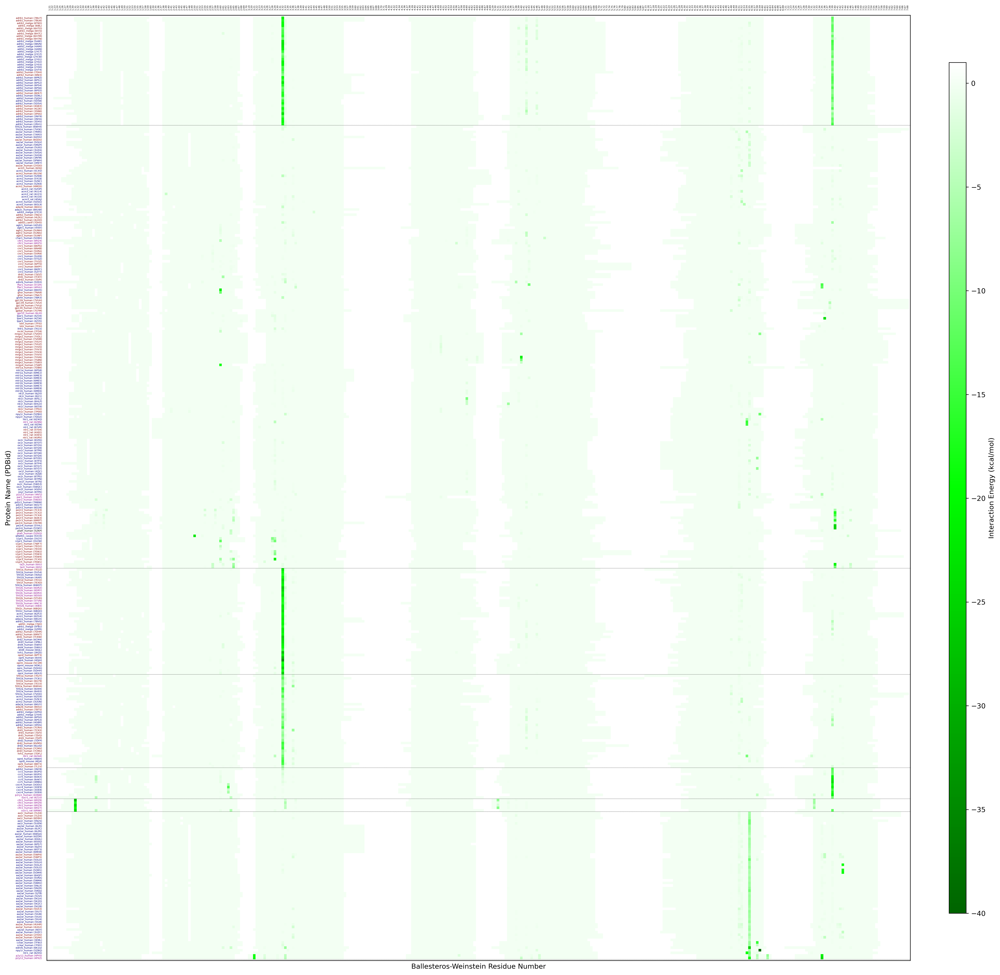

In [437]:
# plot cluster heatmap (all residues)

#imports
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# copy X to plotX, sort by cluster labels then protein names
plotX = X.copy()
plotX['PDBID'] = PDBids
plotX['protein_names'] = protein_names
plotX['cluster_labels'] = labels
plotX['protein_NPDB'] = protein_NPDB
plotX['states'] = states
plotX.sort_values(by = ['cluster_labels', 'protein_names'], ascending = [True, True], na_position = 'first', inplace = True)
plotX.reset_index(inplace = True)
plotX.drop(['index'], axis = 1, inplace = True)

X_mat = plotX.drop(['PDBID', 'protein_names', 'cluster_labels', 'protein_NPDB', 'states'], axis = 1)

# convert some variables to numpy arrays for sorting
structure_df_np = structure_df.to_numpy()
X_mat_np = X_mat.to_numpy()
PDBids_np = np.array(PDBids)
resnums_np = np.array(resnums)
protein_names_np = np.array(protein_names)

# normalization and colormap
norm = plt.Normalize(-40,1)
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["darkgreen","lime","white"])

# plotting
fig = plt.figure(figsize=(25, 25), dpi = 300)
ax = fig.add_subplot(111)
cax = ax.matshow(X_mat, cmap=cmap, norm=norm)
ratio = X.shape[0]/X.shape[1]
cbar = fig.colorbar(cax, fraction=0.04*ratio, pad = 0.04, aspect = 50, shrink = 0.9)
cbar.set_label('Interaction Energy (kcal/mol)', rotation=90)
plt.yticks(np.arange(len(y)), list(plotX['protein_NPDB']), fontsize = 3.5)
plt.xticks(np.arange(len(X_mat.columns)), resnums, fontsize = 3.5, rotation = 90)
plt.xlim([-1,len(resnums)])
plt.ylim([-1,len(PDBids)])
plt.xlabel("Ballesteros-Weinstein Residue Number")
plt.ylabel("Protein Name (PDBid)")
plt.gca().invert_yaxis()


# row lines
for i in row_line_markers:
     plt.axhline(y = i - 0.5, color='black', linestyle='dashed', linewidth = 0.25)


# remove tick marks, keep labels        
plt.gca().tick_params(
    axis='both',          # changes apply to both axes
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    right=False,
    labelbottom=False) # labels along the bottom edge are off

# color tick labels by activation state
for i in range(len(plotX['states'])):
    #print(i, plotX['PDBID'][i], plotX['states'][i])
    if plotX['states'][i] == 'Active':
        plt.gca().get_yticklabels()[i].set_color("maroon")
    elif plotX['states'][i] == 'Inactive':
        plt.gca().get_yticklabels()[i].set_color("navy")
    elif plotX['states'][i] == 'Intermediate':
        plt.gca().get_yticklabels()[i].set_color("darkmagenta")
    elif plotX['states'][i] == 'Other':
        plt.gca().get_yticklabels()[i].set_color("black")
        
plt.show()

In [438]:
# create new variables for plot data, plot resnums
X_mat_int = X_mat.copy()
plot_int_resnums = resnums.copy()

for col in X_mat_int.columns:
    if X_mat_int[col].min() == 0:
        X_mat_int.drop(col, axis = 1, inplace = True)
        plot_int_resnums.remove(col[0:4])
        

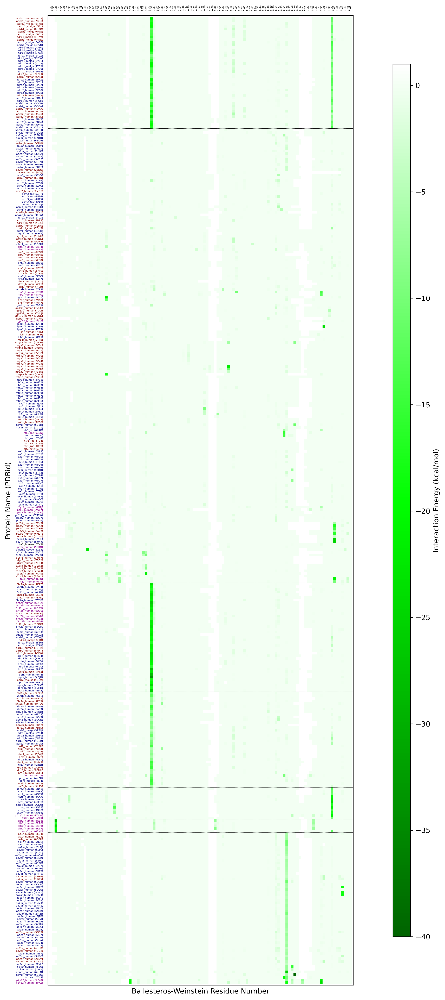

In [439]:
# plot cluster heatmap (interacting residues)

#imports
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
from matplotlib.colors import LinearSegmentedColormap


# matplotlib.rcParams['figure.figsize'] = [25, 25] #width, height (both in inches)
# matplotlib.rcParams['figure.dpi'] = 300 #width, height (both in inches)

# normalization and colormap
norm = plt.Normalize(-40,1)
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["darkgreen","lime","white"])

# plotting
fig = plt.figure(figsize=(25, 25), dpi = 300)
ax = fig.add_subplot(111)
cax = ax.matshow(X_mat_int, cmap=cmap, norm=norm)
ratio = X.shape[0]/X.shape[1]
cbar = fig.colorbar(cax, fraction=0.04*ratio, pad = 0.04, aspect = 50, shrink = 0.9)
cbar.set_label('Interaction Energy (kcal/mol)', rotation=90)
plt.yticks(np.arange(len(y)), list(plotX['protein_NPDB']), fontsize = 3.5)
plt.xticks(np.arange(len(X_mat_int.columns)), plot_int_resnums, fontsize = 3.5, rotation = 90)
plt.xlim([-1,len(plot_int_resnums)])
plt.ylim([-1,len(PDBids)])
plt.xlabel("Ballesteros-Weinstein Residue Number")
plt.ylabel("Protein Name (PDBid)")
plt.gca().invert_yaxis()

# row lines
for i in row_line_markers:
     plt.axhline(y = i - 0.5, color='black', linestyle='dashed', linewidth = 0.25)


        
plt.gca().tick_params(
    axis='both',          # changes apply to both axes
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    right=False,
    labelbottom=False) # labels along the bottom edge are off

# color tick labels by activation state
for i in range(len(plotX['states'])):
    if plotX['states'][i] == 'Active':
        plt.gca().get_yticklabels()[i].set_color("maroon")
    elif plotX['states'][i] == 'Inactive':
        plt.gca().get_yticklabels()[i].set_color("navy")
    elif plotX['states'][i] == 'Intermediate':
        plt.gca().get_yticklabels()[i].set_color("darkmagenta")
    elif plotX['states'][i] == 'Other':
        plt.gca().get_yticklabels()[i].set_color("black")
        
plt.show()

Cluster: 0


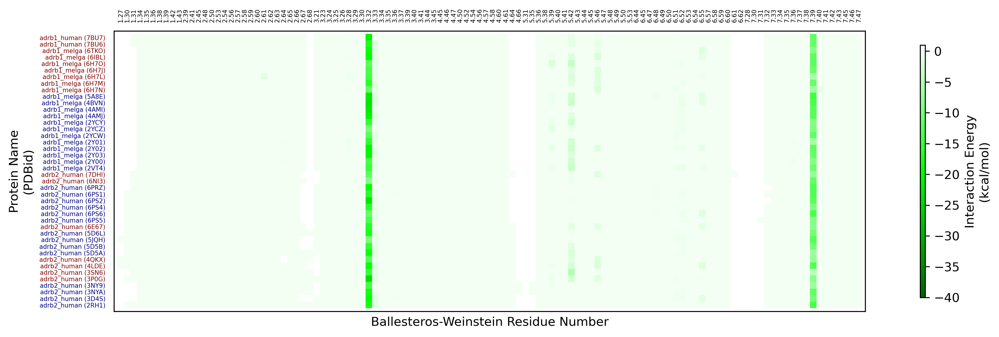

Cluster: 1


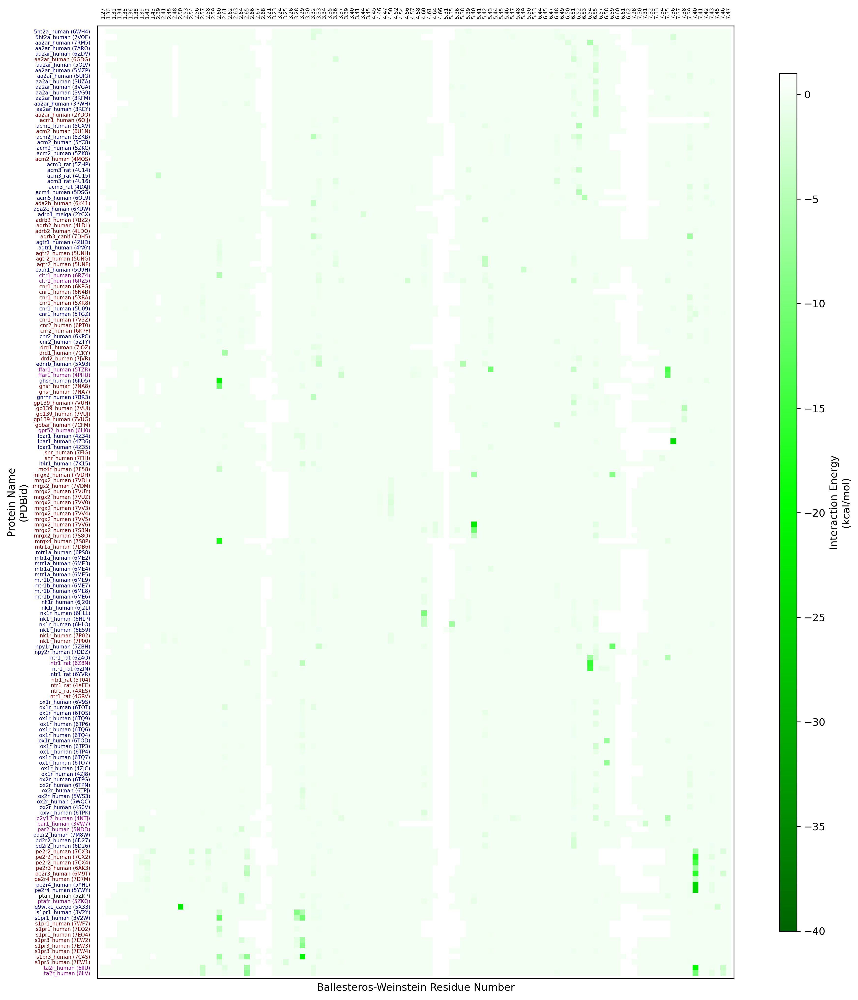

Cluster: 2


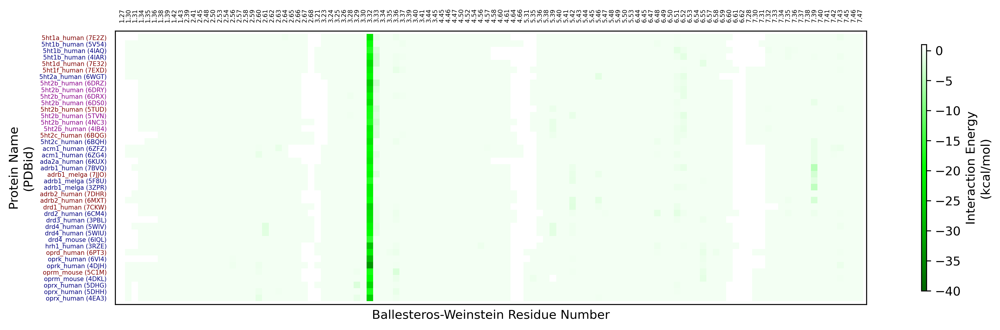

Cluster: 3


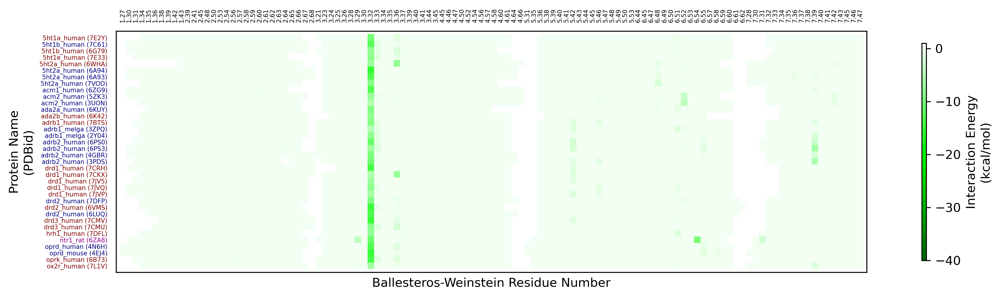

Cluster: 4


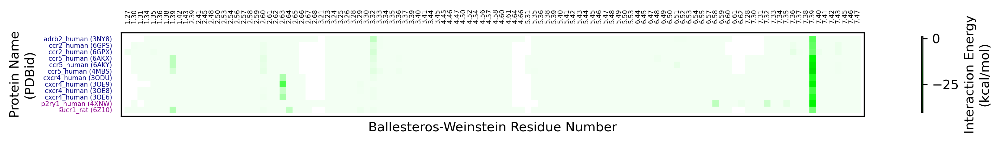

Cluster: 5


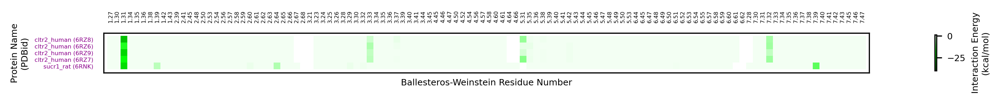

Cluster: 6


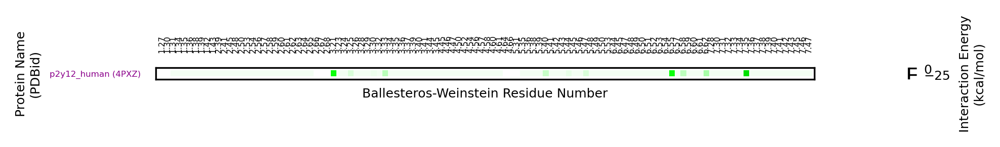

In [440]:
plt.close()
for i in range(len(row_line_markers)):
    x_labels = list(plotX['protein_NPDB'])
    plot_states = list(plotX['states'])
    
    print('Cluster:', i)
    # get data by cluster
    if i == 0:
        sub_X_mat_int = X_mat_int.iloc[0:row_line_markers[i], :]
        sub_x_labels = x_labels[0:row_line_markers[i]]
        sub_plot_states = plot_states[0:row_line_markers[i]]
    elif i == max(range(len(row_line_markers))):
        sub_X_mat_int = X_mat_int.iloc[row_line_markers[i] - 1:, :]
        sub_x_labels = x_labels[row_line_markers[i] - 1:]
        sub_plot_states = plot_states[row_line_markers[i] - 1:]
    else:
        sub_X_mat_int = X_mat_int.iloc[row_line_markers[i-1]:row_line_markers[i], :]
        sub_x_labels = x_labels[row_line_markers[i-1]:row_line_markers[i]]
        sub_plot_states = plot_states[row_line_markers[i-1]:row_line_markers[i]]
    
#     matplotlib.rcParams['figure.figsize'] = [25, 25] #width, height (both in inches)
#     matplotlib.rcParams['figure.dpi'] = 300 #width, height (both in inches)


    # normalization and colormap
    norm = plt.Normalize(-40,1)
    cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["darkgreen","lime","white"])

    # plotting
    fig = plt.figure(figsize=(20,len(sub_X_mat_int) / 10))
    ax = fig.add_subplot(111)
    cax = ax.matshow(sub_X_mat_int, cmap=cmap, norm=norm)
    ratio = X.shape[0]/X.shape[1]
    if len(sub_X_mat_int) < 10:
        plt.yticks(np.arange(len(sub_x_labels)), sub_x_labels, fontsize = 4)
        plt.xticks(np.arange(len(sub_X_mat_int.columns)), plot_int_resnums, fontsize = 3.75, rotation = 90)
        plt.xlabel("Ballesteros-Weinstein Residue Number", fontsize = 6)
        plt.ylabel("Protein Name\n(PDBid)", fontsize = 6)
        plt.ylabel("Protein Name\n(PDBid)", fontsize = 6)
        cbar = fig.colorbar(cax, fraction=0.04*ratio, pad = 0.04, shrink = 0.9)
        cbar.set_label('Interaction Energy\n(kcal/mol)', rotation=90, fontsize = 6)
        cbar.ax.tick_params(labelsize=6)
    else:
        plt.yticks(np.arange(len(sub_x_labels)), sub_x_labels, fontsize = 5)
        plt.xticks(np.arange(len(sub_X_mat_int.columns)), plot_int_resnums, fontsize = 5, rotation = 90)
        plt.xlabel("Ballesteros-Weinstein Residue Number", fontsize = 10)
        plt.ylabel("Protein Name\n(PDBid)", fontsize = 10)
        cbar = fig.colorbar(cax, fraction=0.04*ratio, pad = 0.04, aspect = 50, shrink = 0.9)
        cbar.set_label('Interaction Energy\n(kcal/mol)', rotation=90)
    plt.xlim([-1,len(plot_int_resnums)])
    plt.ylim([-1,len(sub_x_labels)])
    plt.gca().invert_yaxis()

    plt.gca().tick_params(
        axis='both',          # changes apply to both axes
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        left=False,
        right=False,
        labelbottom=False) # labels along the bottom edge are off

    # color tick labels by activation state
    for i in range(len(sub_plot_states)):
        if sub_plot_states[i] == 'Active':
            plt.gca().get_yticklabels()[i].set_color("maroon")
        elif sub_plot_states[i] == 'Inactive':
            plt.gca().get_yticklabels()[i].set_color("navy")
        elif sub_plot_states[i] == 'Intermediate':
            plt.gca().get_yticklabels()[i].set_color("darkmagenta")
        elif sub_plot_states[i] == 'Other':
            plt.gca().get_yticklabels()[i].set_color("black")    

    plt.show()
    plt.close()

In [47]:
ml_df.drop(['cluster_labels'], axis = 1, inplace = True)

## COCLUST

In [35]:
import pickle

# read in filled ml_df for plotting
ml_df = pd.read_pickle('pickles/ml_df_filled_intresidues_intenergysums_nonscaled.pkl')

# keep only intenergysum columns
for col in ml_df.columns:
    if 'intenergysum' not in col:
        ml_df.drop([col], axis = 1, inplace = True)
        
# ml_df.fillna(999, inplace = True)
        
display(ml_df)

,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,7EXD_intenergysum,...,6ZA8_intenergysum,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0
1,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-23.808136
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109,0.0,0.0,0.0,0.0,-0.1,-0.1,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
110,0.0,0.0,0.0,0.0,-0.6,0.0,0.0,0.0,0.0,-0.2,...,0.0,0.0,0.0,0.0,0.0,-0.1,0.0,-0.2,0.0,0.0
111,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
112,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [36]:
resnums = list(pd.read_pickle('pickles/y_intresidues.pkl'))

In [37]:
ml_df['7EW2_intenergysum'].value_counts()

 0.000000    97
-2.300000     1
-0.200000     1
-1.133249     1
-6.744811     1
-0.100000     1
Name: 7EW2_intenergysum, dtype: int64

In [38]:
len(resnums)

114

In [39]:
from sklearn.impute import SimpleImputer

# data imputation
X = ml_df.copy()
my_imputer = SimpleImputer()
X = pd.DataFrame(my_imputer.fit_transform(X))

#data scaling from 0 to 1
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
to_scale = [col for col in X.columns.values]
scaler.fit(X[to_scale])
X[to_scale] = scaler.transform(X[to_scale])

# predict z-scores on the test set
X[to_scale] = scaler.transform(X[to_scale]) 

In [40]:
display(X)

,0,1,2,3,4,5,6,7,8,9,...,354,355,356,357,358,359,360,361,362,363
0,1.146004,1.115160,2.927619,1.514817,1.161779,1.149393,1.176195,1.672665,10.816514,1.045792,...,1.089976,0.0,0.0,10.906542,4.302181,1.054452,1.067231,0.997168,1.100308,1.042002
1,1.148262,1.116443,2.927619,1.514817,1.163934,1.151515,1.178571,1.689004,11.000000,1.046261,...,1.092383,0.0,0.0,11.000000,4.333333,1.055098,1.067231,0.997650,1.100308,1.042002
2,1.148262,1.116443,2.927619,1.526316,1.163934,1.151515,1.178571,1.689004,11.000000,1.046261,...,1.092383,0.0,0.0,11.000000,4.333333,1.055098,1.067231,0.997650,1.100308,1.000000
3,1.148262,1.116443,3.000000,1.526316,1.163934,1.151515,1.178571,1.689004,11.000000,1.046261,...,1.092383,0.0,0.0,11.000000,4.333333,1.055098,1.067231,0.997650,1.100308,1.042002
4,1.148262,1.116443,3.000000,1.526316,1.163934,1.151515,1.178571,1.689004,11.000000,1.046261,...,1.092383,0.0,0.0,11.000000,4.333333,1.055098,1.067231,0.997650,1.100308,1.042002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109,1.148262,1.116443,3.000000,1.526316,1.161247,1.149219,1.178571,1.689004,11.000000,1.046261,...,1.092383,0.0,0.0,11.000000,4.333333,1.055098,1.067231,0.997650,1.100308,1.042002
110,1.148262,1.116443,3.000000,1.526316,1.147810,1.151515,1.178571,1.689004,11.000000,1.045833,...,1.092383,0.0,0.0,11.000000,4.333333,1.054794,1.067231,0.997180,1.100308,1.042002
111,1.148262,1.116443,3.000000,1.526316,1.163934,1.151515,1.178571,1.689004,11.000000,1.046261,...,1.092383,0.0,0.0,11.000000,4.333333,1.055098,1.067231,0.997650,1.100308,1.042002
112,1.148262,1.116443,3.000000,1.526316,1.163934,1.151515,1.178571,1.689004,11.000000,1.046261,...,1.092383,0.0,0.0,11.000000,4.333333,1.055098,1.067231,0.997650,1.100308,1.042002


In [41]:
import coclust
from coclust.visualization import (plot_reorganized_matrix, plot_cluster_top_terms, plot_max_modularities)
from coclust.evaluation.internal import best_modularity_partition
from coclust.coclustering import CoclustMod, CoclustSpecMod

In [42]:
X.values.shape

(114, 364)

In [43]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = [25, 10] #width, height (both in inches)
matplotlib.rcParams['figure.dpi'] = 600 #width, height (both in inches)

# get the best co-clustering over a range of cluster numbers
clusters_range = range(2, 51)
model, modularities = best_modularity_partition(X.values, clusters_range, n_rand_init=1)

plot_max_modularities(modularities, range(2, 52))

Computing coclust modularity for a range of cluster numbers =
 2 ...
 3 ...
 4 ...
 5 ...
 6 ...
 7 ...
 8 ...
 9 ...
 10 ...
 11 ...
 12 ...
 13 ...
 14 ...
 15 ...
 16 ...
 17 ...
 18 ...
 19 ...
 20 ...
 21 ...
 22 ...
 23 ...
 24 ...
 25 ...
 26 ...
 27 ...
 28 ...
 29 ...
 30 ...
 31 ...
 32 ...
 33 ...
 34 ...
 35 ...
 36 ...
 37 ...
 38 ...
 39 ...
 40 ...
 41 ...
 42 ...
 43 ...
 44 ...
 45 ...
 46 ...
 47 ...
 48 ...
 49 ...
 50 ...
 All done !


In [44]:
i = 2
for mod in modularities:
    if mod == max(modularities):
        print(i)
    i += 1

8
9
12
18
24
28
33
40


In [45]:
model = CoclustSpecMod(n_clusters=40)
model.fit(X.values)

print(model)
predicted_row_labels = model.row_labels_
predicted_column_labels = model.column_labels_

CoclustSpecMod(n_clusters=40)


In [46]:
np.unique(np.array(predicted_row_labels), return_counts=True)

(array([ 0,  1,  3,  5,  6,  7,  9, 10, 11, 13, 14, 15, 16, 18, 19, 20, 21,
        22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 37, 38, 39]),
 array([ 7,  1,  1,  1,  1, 72,  1,  1,  1,  1,  1,  2,  1,  1,  1,  1,  1,
         1,  3,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  2,  1,  1],
       dtype=int64))

In [47]:
np.unique(np.array(predicted_column_labels), return_counts=True)

(array([ 0,  2,  4,  7,  8, 11, 12, 15, 17, 23, 30, 36]),
 array([ 67,   1,  10,  29,   7, 161,   1,   8,   1,  63,   1,  15],
       dtype=int64))

### Plotting Coclust Clustering

In [48]:
ml_df.fillna(999, inplace = True)

In [49]:
ml_df.dtypes

7EW2_intenergysum    float64
7EW3_intenergysum    float64
7EW4_intenergysum    float64
7EW1_intenergysum    float64
7LD4_intenergysum    float64
                      ...   
5C1M_intenergysum    float64
4EJ4_intenergysum    float64
4DKL_intenergysum    float64
6Z10_intenergysum    float64
6RNK_intenergysum    float64
Length: 364, dtype: object

In [21]:
len(ml_df)

114

In [22]:
len(resnums)

NameError: name 'resnums' is not defined

In [23]:
# determine where to place row lines
uniqs = np.unique(np.array(predicted_row_labels), return_counts=True)
line_count = 0
row_line_markers = []
for i in list(uniqs[1]):
    line_count += i
    row_line_markers.append(line_count)
    print(line_count)
    
print(row_line_markers)

1
9
81
82
83
85
86
87
88
89
90
91
92
96
97
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
[1, 9, 81, 82, 83, 85, 86, 87, 88, 89, 90, 91, 92, 96, 97, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114]


In [167]:
# determine where to place column lines
uniqs = np.unique(np.array(predicted_column_labels), return_counts=True)
line_count = 0
col_line_markers = []
for i in list(uniqs[1]):
    line_count += i
    col_line_markers.append(line_count)
    print(line_count)
    
print(col_line_markers)

4
295
362
364
[4, 295, 362, 364]


In [168]:
PDBids = PDBIDs

<Figure size 15000x15000 with 0 Axes>

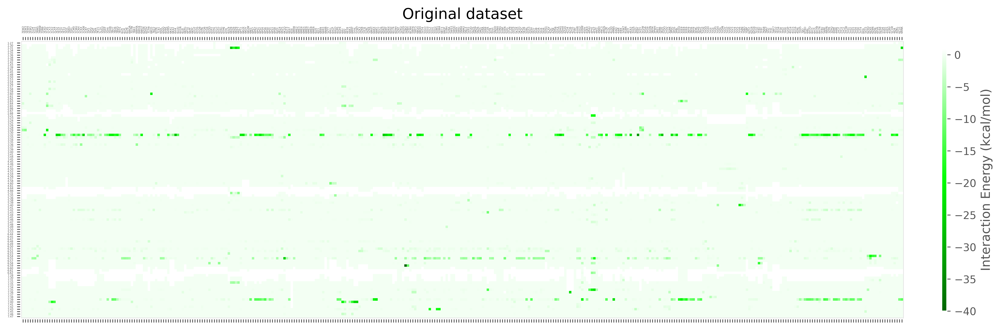

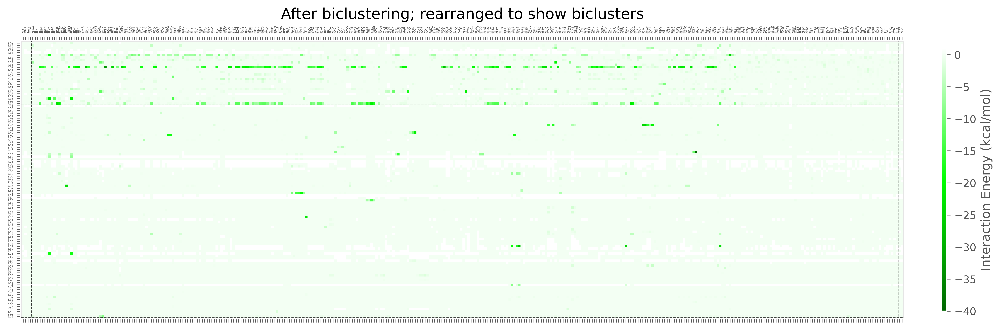

In [169]:
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
from matplotlib.colors import LinearSegmentedColormap


matplotlib.rcParams['figure.figsize'] = [25, 25] #width, height (both in inches)
matplotlib.rcParams['figure.dpi'] = 600 #width, height (both in inches)
fig = plt.figure(figsize=(25, 25), dpi = 600)

# convert some variables to numpy arrays for sorting
ml_df_np = ml_df.to_numpy()
X_np = X.to_numpy()
PDBids_np = np.array(PDBids)
resnums_np = np.array(resnums)

# Original Dataset Plot
#plt.gcf().set_size_inches(75, 75)
#plt.gcf().set_dpi(300)
norm= plt.Normalize(-40,1)
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["darkgreen","lime","white"])
plt.matshow(ml_df, cmap=cmap, norm=norm)
ratio = X.shape[0]/X.shape[1]
cbar = plt.colorbar(fraction=0.04*ratio, pad = 0.04, aspect = 50, shrink = 0.9)
cbar.set_label('Interaction Energy (kcal/mol)', rotation=90)
plt.yticks(np.arange(len(y)), resnums, fontsize = 2.5)
plt.xticks(np.arange(len(X.columns)), PDBids, fontsize = 2.5, rotation = 90)

# # Gridlines
# plt.gca().set_xticks([x - 0.5 for x in plt.gca().get_xticks()][1:], minor='true')
# plt.gca().set_yticks([y - 0.5 for y in plt.gca().get_yticks()][1:], minor='true')
# plt.grid(which='minor', color = 'white', linewidth = 0.1)

# for i in range(len(resnums)):
#     plt.axhline(y= i + 0.5, color='white', linestyle='-', linewidth = 0.1)
    
# for i in range(len(PDBids)):
#     plt.axhline(y= i + 0.5, color='white', linestyle='-', linewidth = 0.1)

plt.ylim([-1,len(resnums)])
plt.xlim([-1,len(PDBids)])
plt.gca().invert_yaxis()
plt.title("Original dataset")
plt.grid(None)
# plt.savefig('plots/allresidues_biclustering_10clusters_original.png')

plt.show()

# Biclustering Arranged Plot

fit_data = ml_df_np[np.argsort(predicted_row_labels)]
fit_data = fit_data[:, np.argsort(predicted_column_labels)]

plt.matshow(fit_data, cmap=cmap, norm=norm)
ratio = X.shape[0]/X.shape[1]
cbar = plt.colorbar(fraction=0.04*ratio, pad = 0.04, aspect = 50, shrink = 0.9)
cbar.set_label('Interaction Energy (kcal/mol)', rotation=90)
plt.yticks(np.arange(len(y)), list(resnums_np[np.argsort(predicted_row_labels)]), fontsize = 2.5)
plt.xticks(np.arange(len(X.columns)), list(PDBids_np[np.argsort(predicted_column_labels)]), fontsize = 2.5, rotation = 90)

# column lines
for i in col_line_markers:
     plt.axvline(x = i - 0.5, color='black', linestyle='dashed', linewidth = 0.25)
        
# row lines
for i in row_line_markers:
     plt.axhline(y = i - 0.5, color='black', linestyle='dashed', linewidth = 0.25)


plt.ylim([-1,len(resnums)])
plt.xlim([-1,len(PDBids)])
plt.gca().invert_yaxis()
plt.title("After biclustering; rearranged to show biclusters")
plt.grid(None) 
# plt.savefig('plots/allresidues_biclustering_10clusters_rearranged.png')

plt.show()

In [315]:
ml_df

,7EW2_intenergysum,7EW3_intenergysum,7EW4_intenergysum,7EW1_intenergysum,7LD4_intenergysum,7LD3_intenergysum,7RM5_intenergysum,7M8W_intenergysum,7DB6_intenergysum,7EXD_intenergysum,...,6ZA8_intenergysum,5T04_intenergysum,4XEE_intenergysum,4XES_intenergysum,4GRV_intenergysum,5C1M_intenergysum,4EJ4_intenergysum,4DKL_intenergysum,6Z10_intenergysum,6RNK_intenergysum
0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,...,999.0,999.0,999.0,999.0,999.0,999.0,0.0,999.0,0.0,0.000000
1,0.0,0.0,999.0,999.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2,0.0,0.0,999.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-23.808136
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109,0.0,0.0,0.0,0.0,-0.1,-0.1,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
110,0.0,0.0,0.0,0.0,-0.6,0.0,0.0,0.0,0.0,-0.2,...,0.0,0.0,0.0,0.0,0.0,-0.1,0.0,-0.2,0.0,0.000000
111,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
112,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000


In [289]:
predicted_column_labels

[1,
 1,
 2,
 1,
 1,
 1,
 1,
 2,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 1,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 1,
 2,
 2,
 2,
 2,
 1,
 1,
 2,
 2,
 1,
 2,
 2,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 2,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 1,
 2,
 1,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 1,
 1,
 1,
 1,
 2,
 2,
 1,
 2,
 2,
 1,
 1,
 1,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
